In [4]:
import duckdb
import pandas as pd
pd.options.display.max_columns = None

import matplotlib.pyplot as plt
import missingno as msno
from IPython.display import HTML, display
import plotly.io as pio
import plotly.express as px
import plotly.graph_objects as go

import spacy
import nltk
import re
from nltk.corpus import stopwords
from wordcloud import WordCloud
import subprocess

# Download required NLTK data
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\DELL\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

# 1 - Initial exploration using a data sample. Ramdom selection of 100,000 row.

In [5]:
# Quick exploration
conn = duckdb.connect()

print("=" * 60)
print("STEP 1: Checking CSV Structure")
print("=" * 60)

columns_info = conn.execute("""
    DESCRIBE SELECT * FROM 'b0cd514b-b9cc-4972-a0c2-c91726e6d825.csv' LIMIT 1
""").df()
print(f"\nTotal columns: {len(columns_info)}")
print("\nColumn Information:")
columns_info

STEP 1: Checking CSV Structure

Total columns: 24

Column Information:


,column_name,column_type,null,key,default,extra
0,question_id,BIGINT,YES,None,None,None
1,question_user_id,BIGINT,YES,None,None,None
2,question_language,VARCHAR,YES,None,None,None
3,question_content,VARCHAR,YES,None,None,None
4,question_topic,VARCHAR,YES,None,None,None
5,question_sent,TIMESTAMP WITH TIME ZONE,YES,None,None,None
6,response_id,BIGINT,YES,None,None,None
7,response_user_id,BIGINT,YES,None,None,None
8,response_language,VARCHAR,YES,None,None,None
9,response_content,VARCHAR,YES,None,None,None


In [6]:
# Get a quick peek at first few rows
#pd.set_option('display.max_columns', None)
print("\n" + "=" * 60)
print("STEP 2: Preview First 5 Rows")
print("=" * 60)

# First, get column names and types
sample = conn.execute("""
    SELECT * FROM 'b0cd514b-b9cc-4972-a0c2-c91726e6d825.csv'
                      USING SAMPLE 100000 ROWS;
""").df()

print(f"Sample rows: {len(sample)}, Columns: {len(sample.columns)}")

sample.head(5)
 

#preview_df = preview if isinstance(preview, pd.DataFrame) else pd.DataFrame(preview)



STEP 2: Preview First 5 Rows
Sample rows: 100000, Columns: 24


,question_id,question_user_id,question_language,question_content,question_topic,question_sent,response_id,response_user_id,response_language,response_content,response_topic,response_sent,question_user_type,question_user_status,question_user_country_code,question_user_gender,question_user_dob,question_user_created_at,response_user_type,response_user_status,response_user_country_code,response_user_gender,response_user_dob,response_user_created_at
0,43811634,3035456,swa,Q Aky Plz Unxave Crdo Ata Ya Mbao Aky Plz Plz ...,None,2020-06-25 06:54:26.928029+01:00,43811675,3005523,swa,S36 uko wp,None,2020-06-25 06:55:59.546249+01:00,farmer,blocked,ke,None,NaT,2020-04-12 17:31:40.776468+01:00,farmer,live,ke,None,NaT,2020-04-02 18:36:07.031167+01:00
1,56609107,3564793,swa,Kuna Aina ngapi ya chanjo za kuku,poultry,2021-05-17 18:42:32.359482+01:00,56609187,3457363,swa,S16 chanjo ya kideri tu,None,2021-05-17 18:43:50.647573+01:00,farmer,live,tz,None,NaT,2021-02-10 11:46:54.019879+00:00,farmer,live,tz,None,NaT,2020-11-21 14:34:39.997190+00:00
2,11915704,869332,eng,Which kind of crop can i plant 2 improove the ...,crop,2018-09-24 18:24:12.649619+01:00,11916772,851998,eng,"Q46 wheats, beans,",wheat,2018-09-24 18:29:06.594169+01:00,farmer,live,ke,None,NaT,2018-05-24 06:22:38.368820+01:00,farmer,live,ke,None,NaT,2018-05-14 18:36:16.218267+01:00
3,49967468,3452003,swa,S nataka kujua bei ya miche ya michikichi ya ...,None,2020-11-19 03:55:45.563525+00:00,49968976,3190133,swa,S13 uku kwetu sanya juu ni sh 1500,None,2020-11-19 04:42:11.247388+00:00,farmer,live,tz,None,NaT,2020-11-19 03:48:48.462499+00:00,farmer,live,tz,None,NaT,2020-06-24 06:58:16.628771+01:00
4,10569522,21384,eng,Q A farmer asks: What type of maize variety is...,maize,2018-09-09 18:38:22.519048+01:00,10570218,799235,eng,Q313 H624 H614 H6213 among many others,None,2018-09-09 18:46:18.575116+01:00,farmer,zombie,ke,male,1976-04-15,2015-09-17 16:47:04+01:00,farmer,live,ke,None,NaT,2018-04-19 18:58:19.879810+01:00


## Completeness check using missingno


<Figure size 1200x600 with 0 Axes>

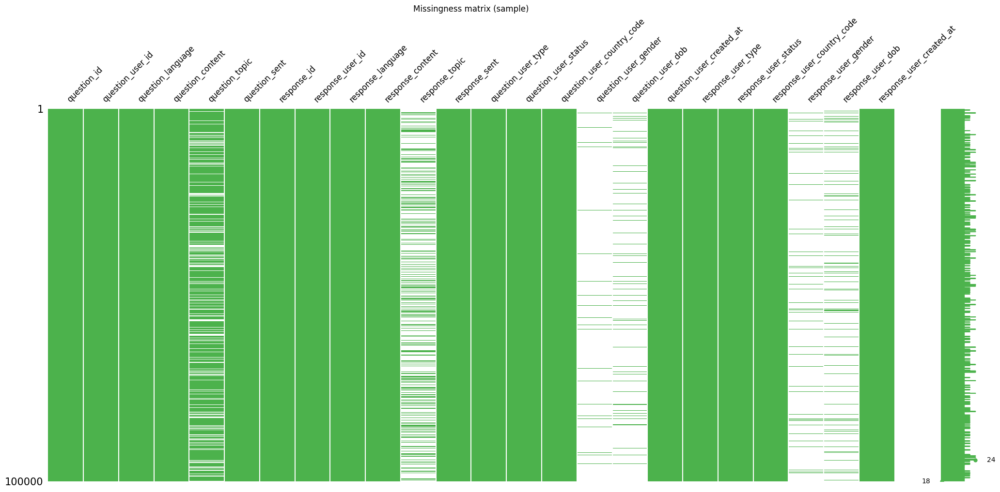

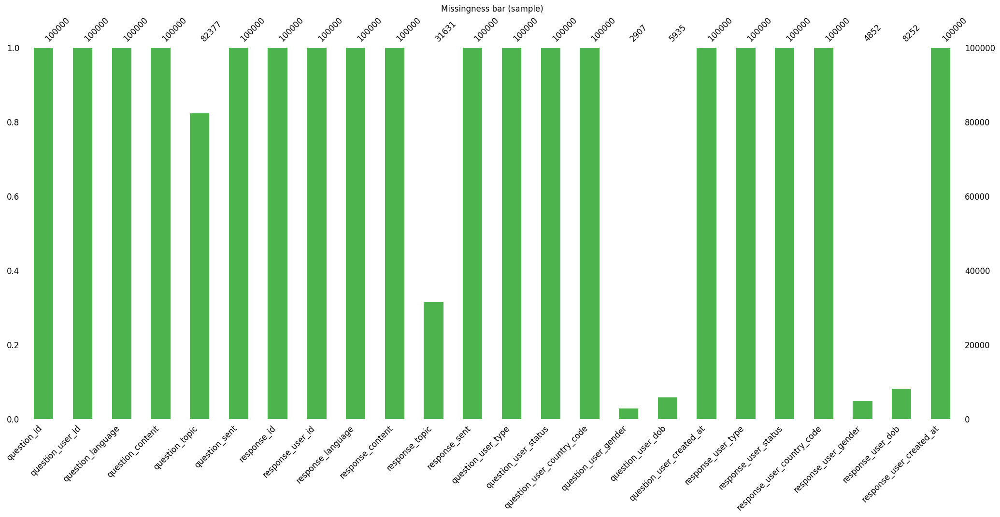

In [7]:
# missingno matrix: shows a visual sparsity grid (white = missing)
plt.figure(figsize=(12, 6))
msno.matrix(sample, fontsize=12, color=(0.3, 0.7, 0.3))
plt.title("Missingness matrix (sample)")
plt.show()

# missingno bar: shows percent present/missing per column
plt.figure(figsize=(10, 6))
msno.bar(sample, fontsize=12, color=(0.3, 0.7, 0.3))
plt.title("Missingness bar (sample)")
plt.show()

In [8]:
# Unique value counts for key columns
key_columns = ['question_user_id', 'question_language', 'question_content', 'question_topic', 'response_language', 
       'response_topic', 'question_user_type', 'question_user_gender',
       'question_user_country_code','response_user_type', 'response_user_status',
       'response_user_country_code', 'response_user_gender'] 
print("\nUnique value counts for key columns:")
for col in key_columns:
    unique_count = sample[col].nunique(dropna=True)
    print(f"  {col}: {unique_count}")


Unique value counts for key columns:
  question_user_id: 76900
  question_language: 4
  question_content: 97114
  question_topic: 135
  response_language: 4
  response_topic: 141
  question_user_type: 1
  question_user_gender: 2
  question_user_country_code: 4
  response_user_type: 1
  response_user_status: 4
  response_user_country_code: 4
  response_user_gender: 2


In [9]:
def safe_plotly_show(fig):
    try:
        fig.show()
    except Exception:
        display(HTML(pio.to_html(fig, include_plotlyjs='cdn')))

# Plot unique value counts for key categorical columns using Plotly:
# - if unique values <= 4 -> pie chart
# - otherwise -> bar chart (top 20)
for col in key_columns:
    if col not in sample.columns:
        print(f"Column not found: {col}")
        continue
    try:
        uniq_count = sample[col].nunique(dropna=True)
        if uniq_count == 0:
            print(f"No values for column: {col}")
            continue

        if uniq_count <= 4:
            vc = sample[col].value_counts(dropna=False)  # include NaNs in pie
            fig = px.pie(values=vc.values, names=vc.index.astype(str),
                         title=f"Distribution of '{col}' (pie, {uniq_count} unique)")
            #fig.update_traces(textposition='inside', textinfo='percent+label+value')
            fig.update_traces(textposition='inside', textinfo='value+label')
        else:
            vc = sample[col].value_counts().head(20)
            fig = px.bar(x=vc.index.astype(str), y=vc.values,
                         title=f"Top 20 Unique Values in '{col}' (bar)")
            fig.update_layout(xaxis_title=col, yaxis_title='Count', bargap=0.2)
            fig.update_traces(text=vc.values, textposition='outside')

        safe_plotly_show(fig)
    except Exception as e:
        print(f"Failed plotting {col}: {e}")

### Plot distribution of questions by month

In [10]:
# ============================================================
# Plot distribution of questions by month
# ============================================================
print("\n" + "=" * 60)
print("STEP: Questions Distribution by Month")
print("=" * 60)

# Check for date/timestamp columns
date_cols = [col for col in sample.columns if any(keyword in col.lower() for keyword in ['date', 'time', 'created', 'posted', 'timestamp'])]
print(f"\nDate/Time columns found: {date_cols}")
print(sample[date_cols].head() if date_cols else "No date columns found")

# If you have a date column, convert and extract month
# Adjust column name based on your actual data
if date_cols:
    date_col = date_cols[0]  # Use first date column
    sample['question_date'] = pd.to_datetime(sample[date_col], errors='coerce')
    sample['question_month'] = sample['question_date'].dt.to_period('M')
    
    # Count questions by month
    questions_by_month = sample['question_month'].value_counts().sort_index()
    
    # Plot
    fig = px.bar(
        x=questions_by_month.index.astype(str),
        y=questions_by_month.values,
        title='Number of Questions Asked by Month',
        labels={'x': 'Month', 'y': 'Number of Questions'},
        text=questions_by_month.values
    )
    fig.update_traces(textposition='outside')
    fig.update_layout(height=600, width=1200, xaxis_tickangle=-45)
    safe_plotly_show(fig)
    
    print(f"\nTotal questions by month:")
    print(questions_by_month)
else:
    print("\nNo date column found in dataset. Available columns:")
    print(sample.columns.tolist())


STEP: Questions Distribution by Month

Date/Time columns found: ['question_user_created_at', 'response_user_created_at']
          question_user_created_at         response_user_created_at
0 2020-04-12 17:31:40.776468+01:00 2020-04-02 18:36:07.031167+01:00
1 2021-02-10 11:46:54.019879+00:00 2020-11-21 14:34:39.997190+00:00
2 2018-05-24 06:22:38.368820+01:00 2018-05-14 18:36:16.218267+01:00
3 2020-11-19 03:48:48.462499+00:00 2020-06-24 06:58:16.628771+01:00
4        2015-09-17 16:47:04+01:00 2018-04-19 18:58:19.879810+01:00


C:\Users\DELL\AppData\Local\Temp\ipykernel_356\3254173664.py:18: UserWarning:

Converting to PeriodArray/Index representation will drop timezone information.




Total questions by month:
question_month
2014-11      2
2015-02     11
2015-03      4
2015-04     10
2015-06    167
          ... 
2021-11      6
2021-12      1
2022-01      8
2022-02      6
2022-03      6
Freq: M, Name: count, Length: 86, dtype: int64


In [11]:
# ============================================================
# Plot distribution of asked questions languages by country
# ============================================================
print("\n" + "=" * 60)
print("STEP: Distribution of Question Languages by Country")
print("=" * 60)

# Get unique countries
countries = sample['question_user_country_code'].dropna().unique()

for country in sorted(countries):
    country_sample = sample[sample['question_user_country_code'] == country]
    
    if len(country_sample) == 0:
        continue
    
    # Get language distribution for this country
    lang_counts = country_sample['question_language'].value_counts(dropna=False)
    uniq_lang_count = country_sample['question_language'].nunique(dropna=True)
    
    try:
        if uniq_lang_count <= 4:
            # Pie chart for few languages
            fig = px.pie(values=lang_counts.values, names=lang_counts.index.astype(str),
                         title=f"Question Languages Distribution in '{country}' ({len(country_sample)} records, {uniq_lang_count} unique)")
            fig.update_traces(textposition='inside', textinfo='value+label+percent')
        else:
            # Bar chart for many languages
            fig = px.bar(x=lang_counts.index.astype(str), y=lang_counts.values,
                         title=f"Question Languages Distribution in '{country}' ({len(country_sample)} records)")
            fig.update_layout(xaxis_title='Language', yaxis_title='Count', bargap=0.2)
            fig.update_traces(text=lang_counts.values, textposition='outside')
        
        safe_plotly_show(fig)
    except Exception as e:
        print(f"Failed plotting language distribution for {country}: {e}")



STEP: Distribution of Question Languages by Country


In [12]:
# Create a summary dataframe for all countries
lang_by_country = []

for country in sorted(sample['question_user_country_code'].dropna().unique()):
    country_sample = sample[sample['question_user_country_code'] == country]
    lang_counts = country_sample['question_language'].value_counts()
    
    for lang, count in lang_counts.items():
        lang_by_country.append({'Country': country, 'Language': lang, 'Count': count})

lang_country_df = pd.DataFrame(lang_by_country)


In [13]:
# Create stacked bar chart (easier to see total per country)
fig = px.bar(lang_country_df, x='Country', y='Count', color='Language',
             title='Question Languages Distribution by Country (Stacked)',
             barmode='stack')
fig.update_layout(height=500, width=1200)
safe_plotly_show(fig)

In [14]:
country_list = list(lang_country_df['Country'].unique())
language_list = list(lang_country_df['Language'].unique())
labels = country_list + language_list

country_to_index = {country: i for i, country in enumerate(country_list)}
language_to_index = {lang: i + len(country_list) for i, lang in enumerate(language_list)}

sources = lang_country_df['Country'].map(country_to_index)
targets = lang_country_df['Language'].map(language_to_index)
values = lang_country_df['Count']

fig = go.Figure(data=[go.Sankey(
    node=dict(
        label=labels
    ),
    link=dict(
        source=sources,
        target=targets,
        value=values
    )
)])

fig.update_layout(
    title='Language Flow from Country (Sankey Diagram)',
    height=700,
    width=1200,
    font_size=10
)

safe_plotly_show(fig)

## Note on language filtering impact

- By restricting the analysis to English-language questions, we risk excluding users from countries where other languages are prevalent. For example, many users in Tanzania primarily ask questions in Swahili.
- The visualizations show that several countries have significant activity in local languages.
- Excluding non-English questions may bias results, underrepresenting user needs and behaviors in those regions.

In [15]:
sample[sample['question_content'] == 'What is farming?']

,question_id,question_user_id,question_language,question_content,question_topic,question_sent,response_id,response_user_id,response_language,response_content,response_topic,response_sent,question_user_type,question_user_status,question_user_country_code,question_user_gender,question_user_dob,question_user_created_at,response_user_type,response_user_status,response_user_country_code,response_user_gender,response_user_dob,response_user_created_at,question_date,question_month
7282,54103103,2548565,eng,What is farming?,None,2021-03-07 18:24:20.227330+00:00,54346893,1484027,eng,Q.162.Farming is apractice carried out on the ...,animal,2021-03-15 08:12:25.024675+00:00,farmer,live,ug,None,NaT,2019-10-02 20:01:20.861362+01:00,farmer,live,ug,None,1972-03-23,2018-11-15 17:25:32.578064+00:00,2019-10-02 20:01:20.861362+01:00,2019-10
11331,52145272,2299107,eng,What is farming?,None,2021-01-03 09:12:21.117875+00:00,58012944,1770848,eng,Q1 how can i plant white beans,plant,2021-08-04 14:30:08.910079+01:00,farmer,live,ug,male,NaT,2019-07-18 11:44:04.508581+01:00,farmer,live,ug,None,NaT,2018-12-18 18:48:52.802953+00:00,2019-07-18 11:44:04.508581+01:00,2019-07
16382,54647135,3587264,eng,What is farming?,None,2021-03-23 13:13:23.777116+00:00,54649054,1488018,eng,It is the growing of crop and rearing of animals,crop,2021-03-23 14:00:10.566681+00:00,farmer,live,ug,None,NaT,2021-03-09 19:00:37.755600+00:00,farmer,live,ug,None,NaT,2018-11-15 18:34:02.862480+00:00,2021-03-09 19:00:37.755600+00:00,2021-03
26783,11009431,1148819,eng,What is farming?,None,2018-09-14 10:29:21.873843+01:00,11103242,1164250,eng,Q9 farming is the growing of crops and rearing...,animal,2018-09-15 09:07:17.763346+01:00,farmer,live,ug,None,NaT,2018-08-29 15:06:50.693051+01:00,farmer,live,ug,None,NaT,2018-09-03 11:20:00.135686+01:00,2018-08-29 15:06:50.693051+01:00,2018-08
30006,58610079,3723234,eng,What is farming?,None,2021-08-25 20:48:42.087300+01:00,58613541,2107002,eng,Q189 it z de growing ov crops and rearing of a...,crop,2021-08-26 07:46:32.451685+01:00,farmer,blocked,ug,None,NaT,2021-08-17 09:42:18.503559+01:00,farmer,live,ug,None,NaT,2019-05-07 14:11:13.324016+01:00,2021-08-17 09:42:18.503559+01:00,2021-08
46709,52145272,2299107,eng,What is farming?,None,2021-01-03 09:12:21.117875+00:00,52146310,3372440,eng,Q49 It is the planting ov seeds en rearing ov ...,animal,2021-01-03 09:28:44.878084+00:00,farmer,live,ug,male,NaT,2019-07-18 11:44:04.508581+01:00,farmer,live,ug,None,NaT,2020-10-14 17:28:39.314173+01:00,2019-07-18 11:44:04.508581+01:00,2019-07
62689,9924445,1139283,eng,What is farming?,None,2018-08-29 03:46:11.857397+01:00,9944429,411403,eng,Reply Q189 farming is the growing of crops an...,bird,2018-08-29 12:31:52.533652+01:00,farmer,zombie,ug,None,NaT,2018-08-26 19:33:10.691121+01:00,farmer,live,ug,None,1920-05-17,2017-10-03 13:19:27+01:00,2018-08-26 19:33:10.691121+01:00,2018-08
66690,52145219,3529781,eng,What is farming?,None,2021-01-03 09:09:58.874934+00:00,52206428,3422247,eng,Q8 is the planting and rearing of animals.,animal,2021-01-05 04:52:00.260672+00:00,farmer,blocked,ug,None,NaT,2021-01-03 07:00:09.677112+00:00,farmer,live,ug,None,NaT,2020-11-07 16:09:34.452231+00:00,2021-01-03 07:00:09.677112+00:00,2021-01
74909,32442256,1884492,eng,What is farming?,None,2019-09-29 07:39:31.934911+01:00,32442334,1488172,eng,qn25 In general farming refer to growing of cr...,crop,2019-09-29 07:41:06.856307+01:00,farmer,zombie,ug,None,NaT,2019-02-12 07:02:16.925285+00:00,farmer,live,ug,None,NaT,2018-11-15 19:06:50.624996+00:00,2019-02-12 07:02:16.925285+00:00,2019-02
80429,58368105,3111051,eng,What is farming?,None,2021-08-16 15:45:47.312776+01:00,58368214,3713340,eng,Qn8 is the rearing of domestic animals and gro...,animal,2021-08-16 15:50:43.591040+01:00,farmer,blocked,ug,None,NaT,2020-05-12 16:24:28.368434+01:00,farmer,live,ug,None,NaT,2021-07-29 18:07:03.481905+01:00,2020-05-12 16:24:28.368434+01:00,2020-05


In [16]:
sample[sample['question_content'] == 'What is crop rotation?']

,question_id,question_user_id,question_language,question_content,question_topic,question_sent,response_id,response_user_id,response_language,response_content,response_topic,response_sent,question_user_type,question_user_status,question_user_country_code,question_user_gender,question_user_dob,question_user_created_at,response_user_type,response_user_status,response_user_country_code,response_user_gender,response_user_dob,response_user_created_at,question_date,question_month
2783,58434988,2314316,eng,What is crop rotation?,crop,2021-08-19 04:32:48.345118+01:00,58435045,2854402,eng,Q147 De Growing Diffent Crops On The Same Pice...,crop,2021-08-19 04:41:23.555748+01:00,farmer,live,ug,None,NaT,2019-07-23 19:31:36.752439+01:00,farmer,blocked,ug,None,NaT,2020-01-31 14:39:01.751578+00:00,2019-07-23 19:31:36.752439+01:00,2019-07
4173,47871915,2907254,eng,What is crop rotation?,crop,2020-10-05 17:13:15.908357+01:00,47871994,2771336,eng,Q133z growing v cropz season after season,crop,2020-10-05 17:15:30.553127+01:00,farmer,blocked,ug,None,NaT,2020-02-22 11:27:19.199150+00:00,farmer,live,ug,None,NaT,2019-12-28 17:52:34.769523+00:00,2020-02-22 11:27:19.199150+00:00,2020-02
7671,17437314,1455034,eng,What is crop rotation?,crop,2018-11-30 16:31:27.322139+00:00,18570011,1474881,eng,Q11-crop rotation is method of inter-changing ...,bean,2018-12-08 19:05:06.043045+00:00,farmer,zombie,ke,None,NaT,2018-11-12 14:55:13.454143+00:00,farmer,zombie,ke,None,NaT,2018-11-14 18:14:10.618080+00:00,2018-11-12 14:55:13.454143+00:00,2018-11
13301,47842623,3178270,eng,What is crop rotation?,crop,2020-10-04 17:45:34.171169+01:00,47843061,2758954,eng,Q48 crop rotation is the growing of different ...,crop,2020-10-04 17:54:42.884222+01:00,farmer,live,ug,None,NaT,2020-06-17 19:49:46.255962+01:00,farmer,live,ug,None,NaT,2019-12-19 11:09:02.797853+00:00,2020-06-17 19:49:46.255962+01:00,2020-06
16429,47650582,3305192,eng,What is crop rotation?,crop,2020-09-30 17:31:13.273588+01:00,47775577,3315586,eng,Q78Is de growing of different types on de same...,None,2020-10-02 19:43:34.635474+01:00,farmer,live,ug,None,NaT,2020-08-29 10:28:55.089702+01:00,farmer,live,ug,None,NaT,2020-09-07 06:49:45.296508+01:00,2020-08-29 10:28:55.089702+01:00,2020-08
36419,58586116,3457466,eng,What is crop rotation?,crop,2021-08-25 06:18:06.788765+01:00,58608650,3447027,eng,Crop rotation is the growing of crops and rear...,animal,2021-08-25 19:51:01.101802+01:00,farmer,live,ug,None,NaT,2020-11-21 15:41:44.193875+00:00,farmer,blocked,ug,None,NaT,2020-11-17 06:53:17.683018+00:00,2020-11-21 15:41:44.193875+00:00,2020-11
43463,22174355,1405318,eng,What is crop rotation?,crop,2019-03-04 14:18:04.467616+00:00,22175987,582562,eng,Q162§IS changing of diffrent crops in the same...,crop,2019-03-04 14:27:33.878997+00:00,farmer,live,ug,None,NaT,2018-10-30 15:26:03.946406+00:00,farmer,blocked,ug,None,NaT,2017-12-13 07:55:38+00:00,2018-10-30 15:26:03.946406+00:00,2018-10
58673,58919869,1351247,eng,What is crop rotation?,crop,2021-09-06 19:16:35.661617+01:00,58921471,2803292,eng,Q755 is the growing different types of crops ...,crop,2021-09-06 19:49:37.733026+01:00,farmer,live,ug,None,NaT,2018-10-16 19:38:09.031343+01:00,farmer,blocked,ug,None,NaT,2020-01-13 08:08:16.324762+00:00,2018-10-16 19:38:09.031343+01:00,2018-10
68064,54508323,3532492,eng,What is crop rotation?,crop,2021-03-19 08:22:21.607147+00:00,54511783,2340688,eng,Q55 crop rotation is the growing of different ...,crop,2021-03-19 10:24:43.836919+00:00,farmer,blocked,ug,None,NaT,2021-01-06 08:54:48.170574+00:00,farmer,blocked,ug,None,NaT,2019-07-29 12:15:20.375176+01:00,2021-01-06 08:54:48.170574+00:00,2021-01
77844,36684759,2825213,eng,What is crop rotation?,crop,2020-01-21 11:53:30.966901+00:00,36701209,402528,eng,Q349 Is the planting of different varieties of...,maize,2020-01-21 18:39:55.945740+00:00,farmer,live,ke,None,NaT,2020-01-21 11:50:49.245421+00:00,farmer,live,ke,None,NaT,2017-09-28 19:02:57+01:00,2020-01-21 11:50:49.245421+00:00,2020-01


In [17]:
sample[sample['question_content'] == 'What is crop rotation?']['response_content'].tolist()

['Q147 De Growing Diffent Crops On The Same Pice Of Land Season After Season',
 'Q133z growing v cropz season after season',
 'Q11-crop rotation is method of inter-changing of crops in different seasons e.g if plant beans this season,next you plant maize or any variety',
 'Q48 crop rotation is the growing of different crops on the same piece of land seasion after seasion.',
 'Q78Is de growing of different types on de same piece land seasonly.',
 'Crop rotation is the growing of crops and rearing of animals on the same piece of land throughout the year',
 'Q162§IS changing of diffrent crops in the same pice of land seasion after sasion',
 'Q755 is the  growing different types of crops on the same piece of land by use of padoks season after season',
 'Q55 crop rotation is the growing of different types of crops on the same piece of land seasonally in an orderly sequence.',
 'Q349 Is the planting of different varieties of crops every new season.i e if this year you have planted maize next

### Exploration

In [18]:
print(f"Question: {sample.question_content[16]}\nAnswer: {sample.response_content[16]}")

Question: Q,can hen lay 2 eggs  aday?
Answer: Q 54 yes depending on kind of food you feed on them,,


In [19]:
print(f"Question: {sample.question_content[117]}\nAnswer: {sample.response_content[117]}")

Question: Q-Which tree species is profitable,valued highly and takes a short period to mature?
Answer: Q3 BLUCAM


In [20]:
print(f"Question: {sample.question_content[1155]}\nAnswer: {sample.response_content[1155]}")

Question: q how will i control rats en squarels 4rm eating mi maize,soya,cassava en potatoes 4rm de garden.am zaki emma 4rm pallisa keep a distance.stay home.
Answer: Q2 use ov traps


In [21]:
print(f"Question: {sample.question_content[1257]}\nAnswer: {sample.response_content[1257]}")

Question: Q Which chemical is best to spray tomatoes to get rleday firt?
Answer: Q13 diegrow wil work 4 u.


In [22]:
subprocess.run(['python', '-m', 'spacy', 'download', 'en_core_web_sm'])

# Now load the model
nlp = spacy.load("en_core_web_sm")

my_stopwords = list(set(stopwords.words('english'))) + ['[', ']', ',', '.', ':', '?', '(', ')']

def process_text(text):
    # Text Cleaning + lower case
    cleaned_text = re.sub(r'[^a-zA-Z\s]', ' ', str(text)).lower()
    
    # Tokenization
    doc = nlp(cleaned_text)
    
    # Lemmatization and stopword removal
    processed_tokens = [token.lemma_.lower() for token in doc if (token.lemma_.lower() not in my_stopwords) and (len(token.lemma_.lower()) > 2)]

    # Join processed tokens and normalize spaces
    joined_tokens = re.sub(r'\s{2,}', ' ', ' '.join(processed_tokens))
    
    return joined_tokens


C:\Users\DELL\AppData\Local\Temp\ipykernel_356\1033669385.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



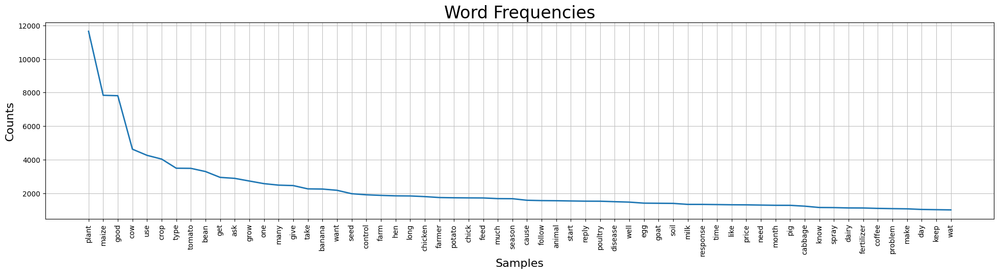

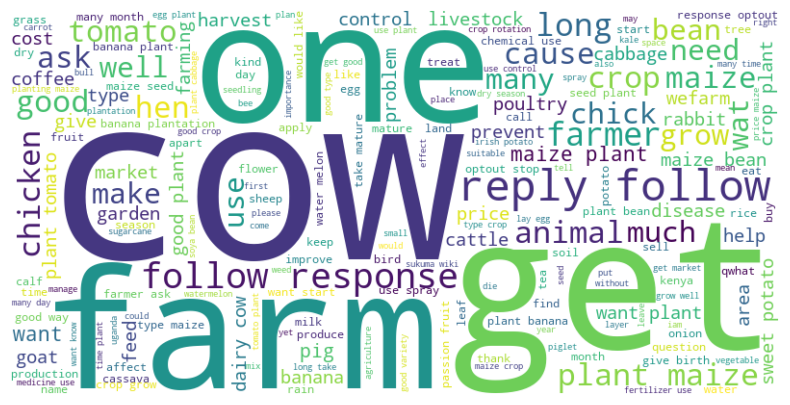

In [23]:
# Filter for 'eng' language only
filtered_sample = sample[sample['question_language'] == 'eng']
filtered_sample['question_content_cleaned'] = filtered_sample['question_content'].apply(process_text)

# Generate word cloud from 'question_content' of filtered data
text = ' '.join(filtered_sample['question_content_cleaned'].dropna().astype(str).values)
wordcloud = WordCloud(width=800, height=400, background_color='white', stopwords=my_stopwords).generate(text)

plt.figure(figsize = (24,5))
plt.title("Word Frequencies", fontsize=24)
plt.xlabel('Words', fontsize=16)
plt.ylabel('Frequency', fontsize=16)
nltk.FreqDist(text.split()).plot(60)
plt.show()

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')  # Hide axes
plt.show()

C:\Users\DELL\AppData\Local\Temp\ipykernel_356\4240228443.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



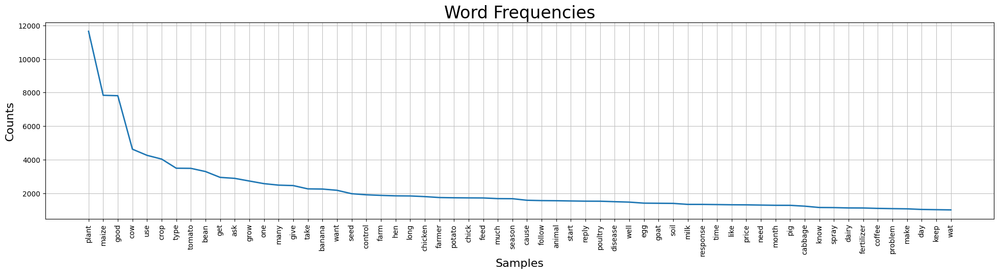

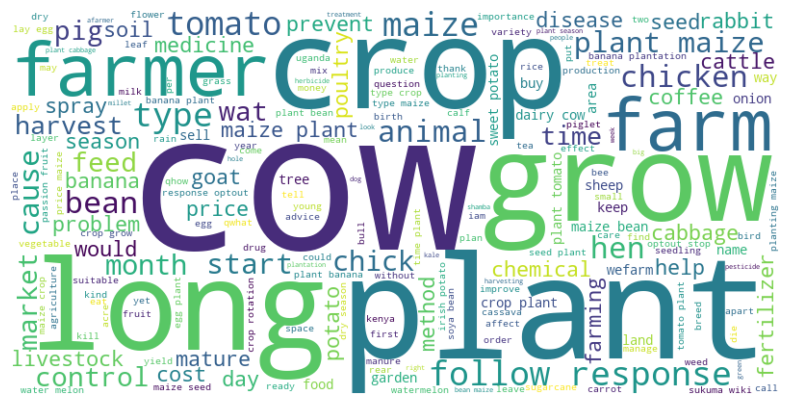

In [24]:
my_stopwords += ['also', 'add', 'get', 'need', 'make', 'take', 'use', 'please', 'perfect', 'fit', 'like', 'bring',
                 'else', 'well', 'one', 'much', 'many', 'thing', 'things', 'lot', 'lots', 'bit', 'ask', 'give',
                 'want', 'good', 'reply', 'know', 'type']
# Iterate through columns and apply text cleaning
filtered_sample['question_content_cleaned'] = filtered_sample['question_content'].apply(process_text)

# Generate word cloud from 'question_content' of filtered data
text = ' '.join(filtered_sample['question_content_cleaned'].dropna().astype(str).values)
wordcloud = WordCloud(width=800, height=400, background_color='white', stopwords=my_stopwords).generate(text)

plt.figure(figsize = (24,5))
plt.title("Word Frequencies", fontsize=24)
plt.xlabel('Words', fontsize=16)
plt.ylabel('Frequency', fontsize=16)
nltk.FreqDist(text.split()).plot(60)
plt.show()

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')  # Hide axes
plt.show()


STEP: Key Words by Country
['ke' 'ug' 'gb']
['gb', 'ke', 'ug']

Top 20 words for country 'gb' (1 records):
  good(1), food(1), nearby(1)


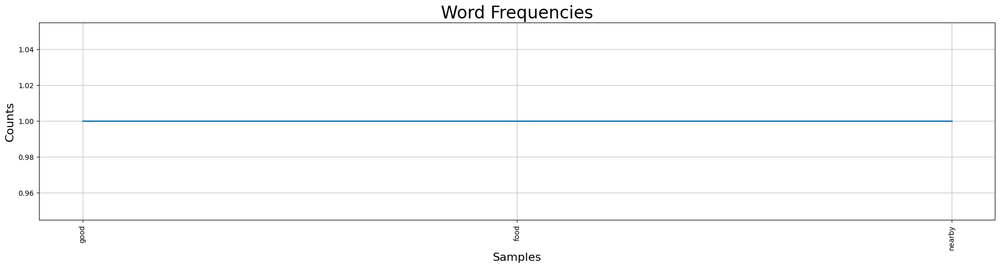

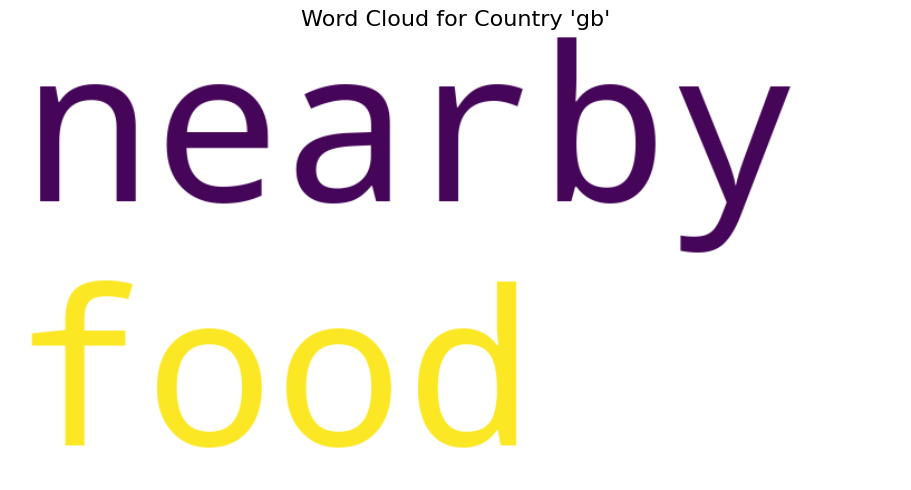


Top 20 words for country 'ke' (37159 records):
  plant(7630), good(5686), maize(5539), cow(3897), use(2630), crop(2440), type(2177), tomato(2155), get(1981), bean(1960), one(1723), give(1704), many(1674), ask(1543), chicken(1528), chick(1438), potato(1416), seed(1410), take(1387), farm(1368)


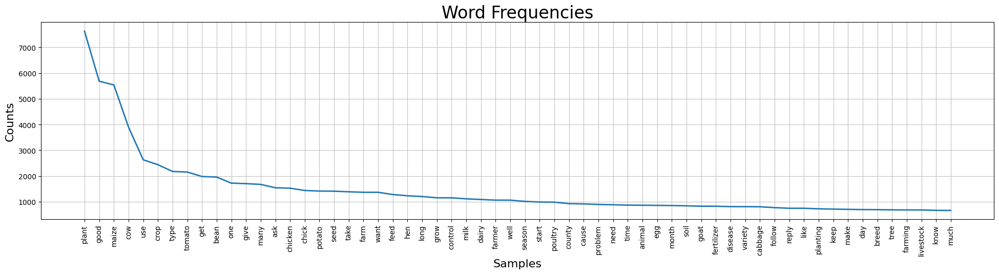

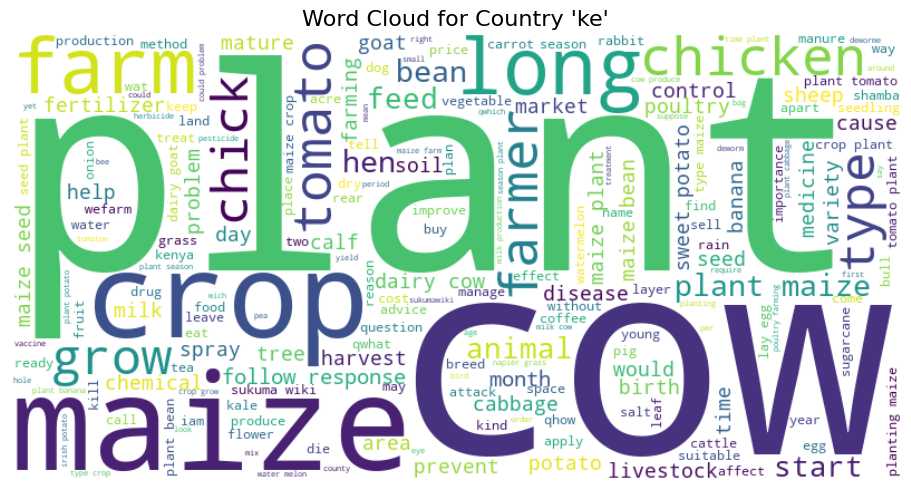


Top 20 words for country 'ug' (22061 records):
  plant(4015), maize(2298), good(2127), use(1634), banana(1611), crop(1601), grow(1582), ask(1351), bean(1340), tomato(1335), type(1320), much(1026), pig(978), get(972), price(907), take(882), one(857), coffee(831), want(817), many(817)


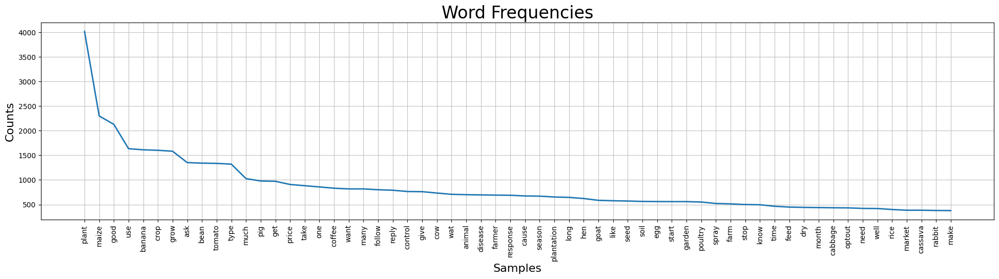

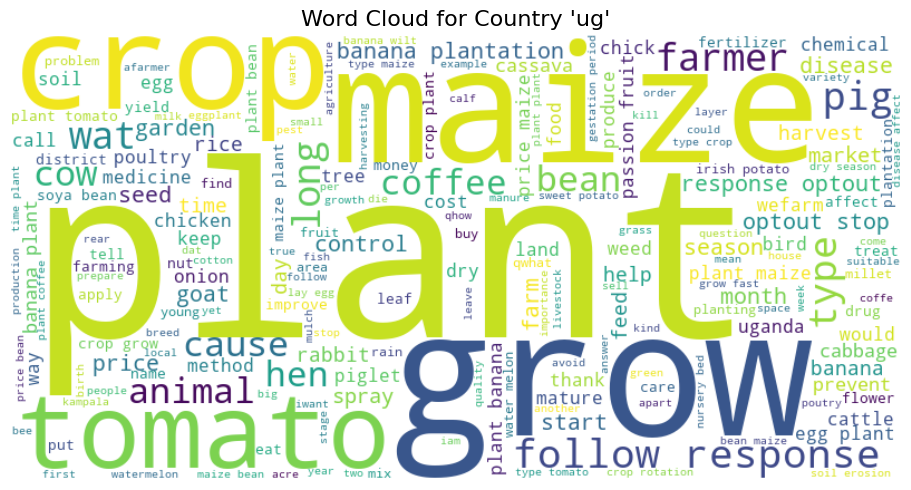

In [25]:
# ============================================================
# Display key words by country
# ============================================================
print("\n" + "=" * 60)
print("STEP: Key Words by Country")
print("=" * 60)

# Get unique countries
countries = filtered_sample['question_user_country_code'].dropna().unique()
print(countries)
print(sorted(countries))

for country in sorted(countries):
    country_sample = filtered_sample[filtered_sample['question_user_country_code'] == country]
    
    if len(country_sample) == 0:
        continue
    
    # Generate text for this country
    country_text = ' '.join(country_sample['question_content_cleaned'].dropna().astype(str).values)
    
    if not country_text.strip():
        print(f"\nNo cleaned text for country: {country}")
        continue
    
    # Get top 20 words for this country
    freq_dist = nltk.FreqDist(country_text.split())
    top_words = freq_dist.most_common(20)
    
    print(f"\nTop 20 words for country '{country}' ({len(country_sample)} records):")
    print(f"  {', '.join([f'{word}({count})' for word, count in top_words])}")
    
    # Generate word cloud for this country
    try:
        wordcloud_country = WordCloud(width=800, height=400, background_color='white', 
                                      stopwords=my_stopwords).generate(country_text)
        
        plt.figure(figsize = (24,5))
        plt.title("Word Frequencies", fontsize=24)
        plt.xlabel('Words', fontsize=16)
        plt.ylabel('Frequency', fontsize=16)
        nltk.FreqDist(country_text.split()).plot(60)
        plt.show()
        
        plt.figure(figsize=(12, 5))
        plt.imshow(wordcloud_country, interpolation='bilinear')
        plt.title(f"Word Cloud for Country '{country}'", fontsize=16)
        plt.axis('off')
        plt.tight_layout()
        plt.show()
    except Exception as e:
        print(f"  Failed to generate word cloud for {country}: {e}")

# Seasoning analysis on SAMPLE DATA (100,000 random specimen)

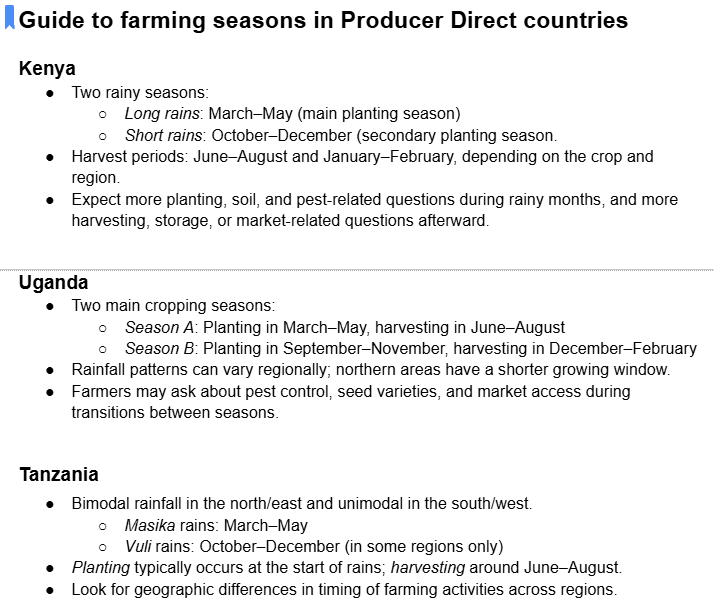

In [31]:
filtered_sample["question_sent"] = pd.to_datetime(filtered_sample["question_sent"], errors="coerce")

# -------------------------------------------------
# Season classification function
# -------------------------------------------------
def assign_farming_season(row):
    country = str(row["question_user_country_code"]).lower()
    date = row["question_sent"]

    if pd.isna(date) or pd.isna(country):
        return "Not Classified"

    month = date.month

    # ---------------- KENYA ----------------
    if country == "ke":
        if month in [3, 4, 5]:
            return "Long Rains - Planting"
        elif month in [10, 11, 12]:
            return "Short Rains - Planting"
        elif month in [6, 7, 8, 1, 2]:
            return "Harvest Period"
        else:
            return "September - Off-season"

    # ---------------- UGANDA ----------------
    elif country == "ug":
        if month in [3, 4, 5]:
            return "Season A - Planting"
        elif month in [6, 7, 8]:
            return "Season A - Harvest"
        elif month in [9, 10, 11]:
            return "Season B - Planting"
        elif month in [12, 1, 2]:
            return "Season B - Harvest"

    # ---------------- TANZANIA ----------------
    elif country == "tz":
        if month in [3, 4, 5]:
            return "Masika - Planting"
        elif month in [10, 11, 12]:
            return "Vuli - Planting"
        elif month in [6, 7, 8]:
            return "Harvest Period"
        else:
            return "Off-season / Other"

    # ---------------- OTHER ----------------
    else:
        return "Not Classified"

# Apply classifier
filtered_sample["farming_season"] = filtered_sample.apply(assign_farming_season, axis=1)

filtered_sample.head(5)


C:\Users\DELL\AppData\Local\Temp\ipykernel_356\2929568658.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\DELL\AppData\Local\Temp\ipykernel_356\2929568658.py:53: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,question_id,question_user_id,question_language,question_content,question_topic,question_sent,response_id,response_user_id,response_language,response_content,response_topic,response_sent,question_user_type,question_user_status,question_user_country_code,question_user_gender,question_user_dob,question_user_created_at,response_user_type,response_user_status,response_user_country_code,response_user_gender,response_user_dob,response_user_created_at,question_date,question_month,question_content_cleaned,uestion_content_cleaned,farming_season
2,11915704,869332,eng,Which kind of crop can i plant 2 improove the ...,crop,2018-09-24 18:24:12.649619+01:00,11916772,851998,eng,"Q46 wheats, beans,",wheat,2018-09-24 18:29:06.594169+01:00,farmer,live,ke,None,NaT,2018-05-24 06:22:38.368820+01:00,farmer,live,ke,None,NaT,2018-05-14 18:36:16.218267+01:00,2018-05-24 06:22:38.368820+01:00,2018-05,kind crop plant improove soil nutrision,kind crop plant improove soil nutrision,September - Off-season
4,10569522,21384,eng,Q A farmer asks: What type of maize variety is...,maize,2018-09-09 18:38:22.519048+01:00,10570218,799235,eng,Q313 H624 H614 H6213 among many others,None,2018-09-09 18:46:18.575116+01:00,farmer,zombie,ke,male,1976-04-15,2015-09-17 16:47:04+01:00,farmer,live,ke,None,NaT,2018-04-19 18:58:19.879810+01:00,2015-09-17 16:47:04+01:00,2015-09,farmer ask type maize variety good grow nakuru...,farmer type maize variety grow nakuru county f...,September - Off-season
5,42269196,522520,eng,lk this period of time can i plant banana plant?.,banana,2020-05-18 10:31:58.283365+01:00,42269932,502992,eng,Q219 Yes its da good time 2plant banana plant.,banana,2020-05-18 10:47:21.754860+01:00,farmer,live,ug,None,NaT,2017-11-20 19:56:41+00:00,farmer,live,ug,None,NaT,2017-11-11 04:39:36+00:00,2017-11-20 19:56:41+00:00,2017-11,period time plant banana plant,period time plant banana plant,Season A - Planting
6,11161308,1189071,eng,Q How best is DAP applied on a crop?,crop,2018-09-16 06:01:13.913344+01:00,11163907,448404,eng,"Q74 , James what is DAP in full",None,2018-09-16 06:54:01.657896+01:00,farmer,destroyed,ug,None,NaT,2018-09-12 09:33:36.702089+01:00,farmer,zombie,ug,None,NaT,2017-10-18 13:44:11+01:00,2018-09-12 09:33:36.702089+01:00,2018-09,good dap apply crop,dap apply crop,Season B - Planting
8,17529959,1303067,eng,Ask a chicken takes how many to start laying eggs,chicken,2018-12-01 10:06:31.994221+00:00,17539772,1197680,eng,Q41 3MONTHS,None,2018-12-01 11:01:34.278201+00:00,farmer,zombie,ke,None,NaT,2018-10-05 13:35:25.487889+01:00,farmer,zombie,ke,None,NaT,2018-09-13 13:33:07.027789+01:00,2018-10-05 13:35:25.487889+01:00,2018-10,ask chicken take many start lay egg,chicken start lay egg,Short Rains - Planting



KEYWORDS BY COUNTRY AND SEASON
Countries: ['gb', 'ke', 'ug']

COUNTRY: gb (1 questions)

 Top 20 Words Overall:
   food(1), nearby(1)

 By Season:


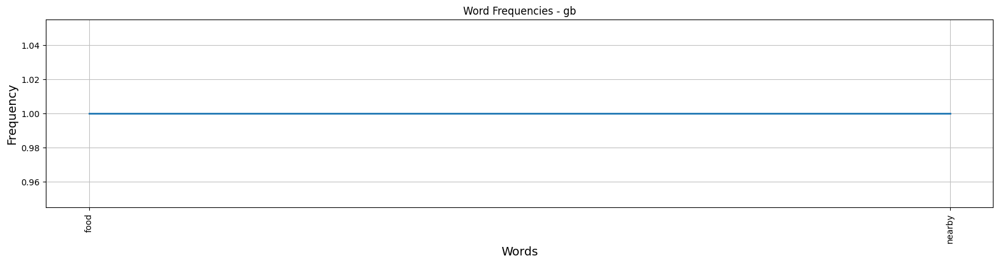

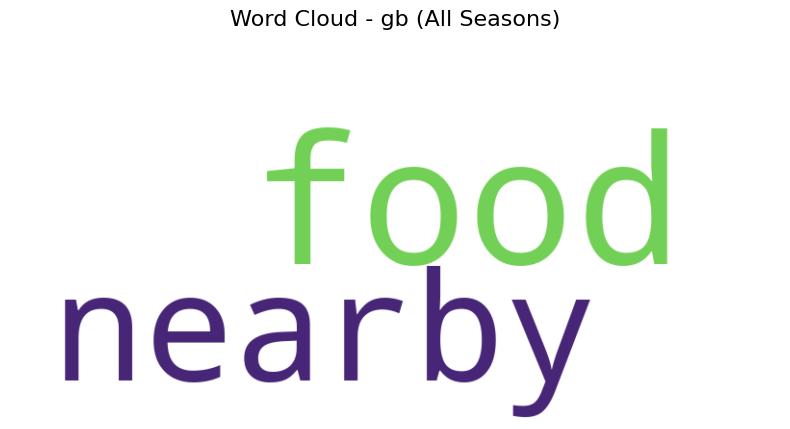


COUNTRY: ke (37,159 questions)

 Top 20 Words Overall:
   plant(7630), maize(5539), cow(3897), crop(2440), type(2177), tomato(2155), bean(1960), chicken(1528), chick(1438), potato(1416), seed(1410), farm(1368), feed(1280), hen(1232), long(1202), grow(1154), control(1153), milk(1114), dairy(1087), farmer(1062)

 By Season:

   September - Off-season (4,068 questions)
   plant(969), maize(815), cow(430), crop(279), bean(268), tomato(247), type(232), seed(184), chick(178), farm(169)


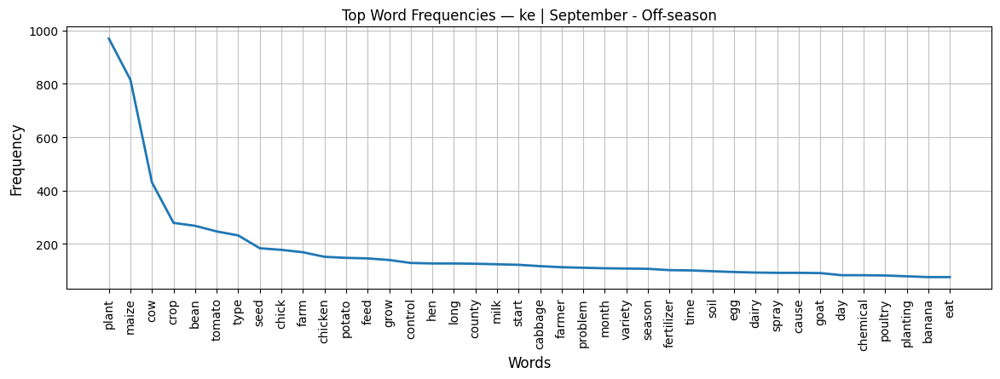


   Short Rains - Planting (12,143 questions)
   plant(2131), maize(1920), cow(1521), crop(759), type(693), chicken(604), chick(564), tomato(476), hen(470), bean(466)


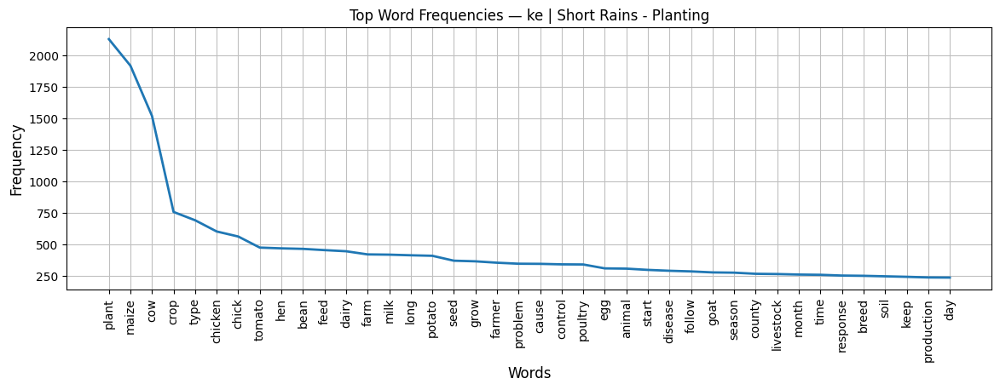


   Long Rains - Planting (8,631 questions)
   plant(1965), maize(1421), cow(804), crop(597), bean(585), type(529), potato(388), seed(365), tomato(331), farm(315)


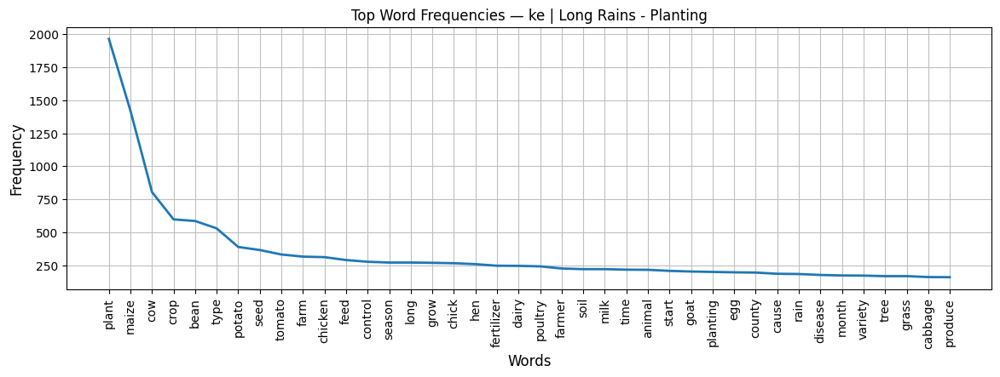


   Harvest Period (12,317 questions)
   plant(2565), maize(1383), cow(1142), tomato(1101), crop(805), type(723), bean(641), seed(489), potato(469), farm(462)


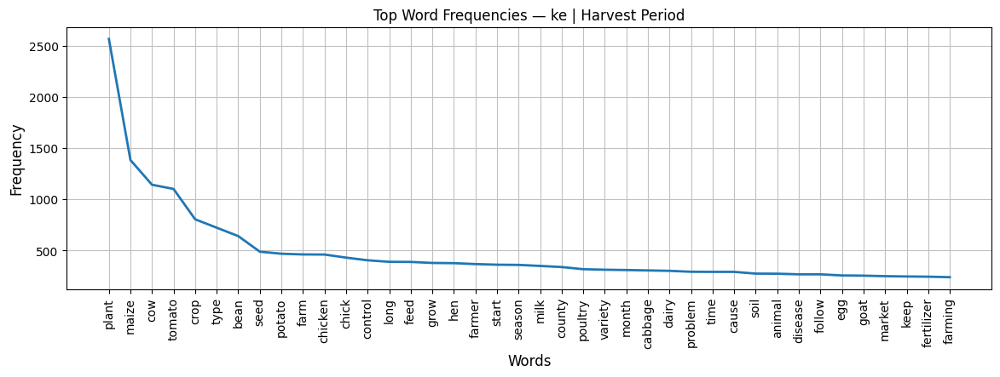

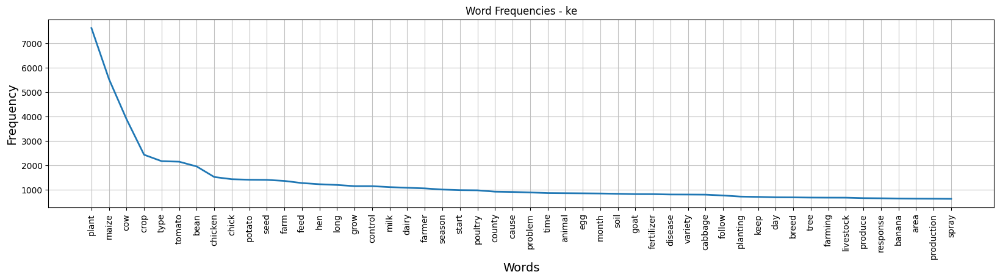

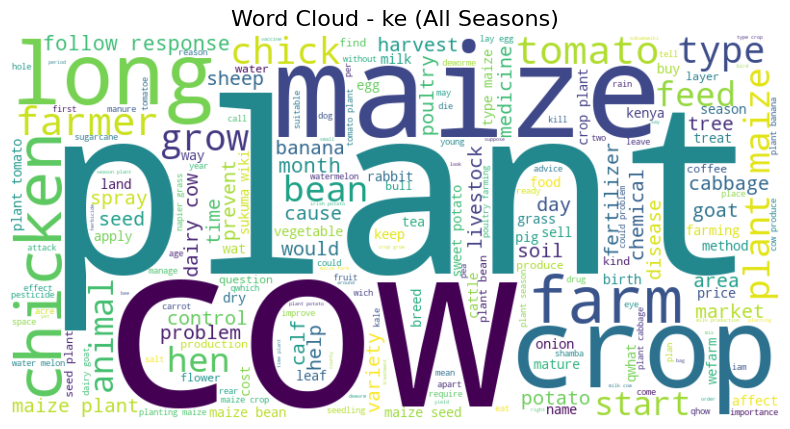

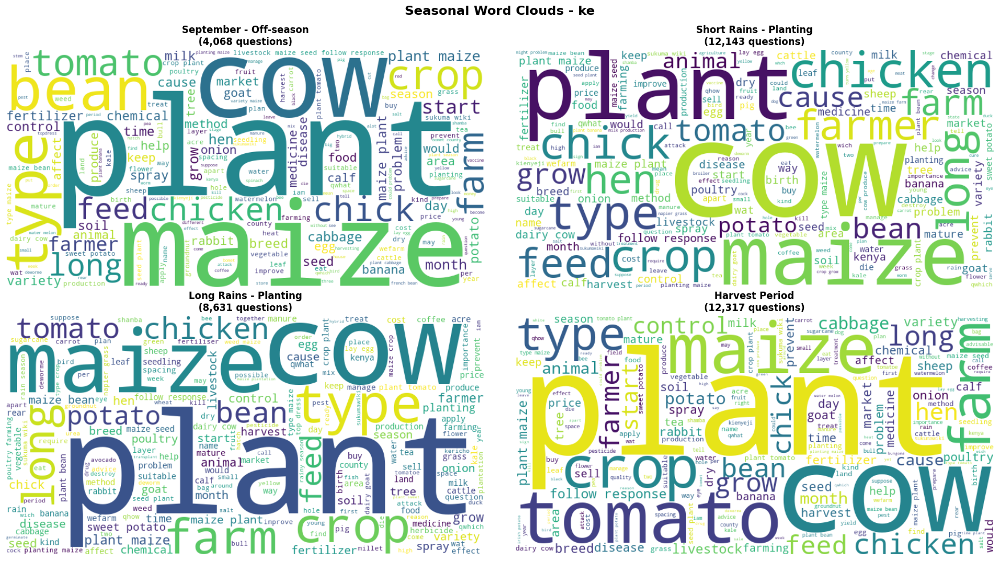


COUNTRY: ug (22,061 questions)

 Top 20 Words Overall:
   plant(4015), maize(2298), banana(1611), crop(1601), grow(1582), bean(1340), tomato(1335), type(1320), pig(978), price(907), coffee(831), follow(800), control(764), cow(733), wat(707), animal(700), disease(695), farmer(691), response(688), cause(674)

 By Season:

   Season A - Planting (4,454 questions)
   plant(948), maize(455), banana(367), grow(348), crop(330), bean(303), type(273), tomato(252), pig(206), follow(190)


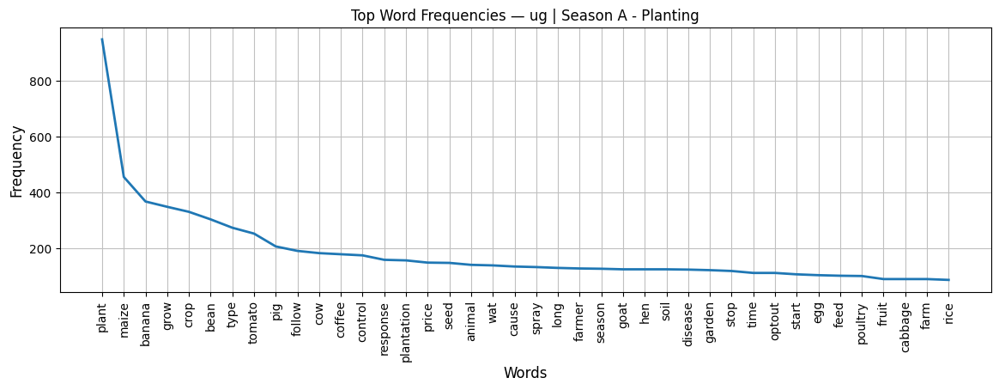


   Season B - Planting (7,072 questions)
   plant(1294), maize(1010), crop(557), banana(544), grow(530), bean(481), type(428), tomato(354), pig(301), price(289)


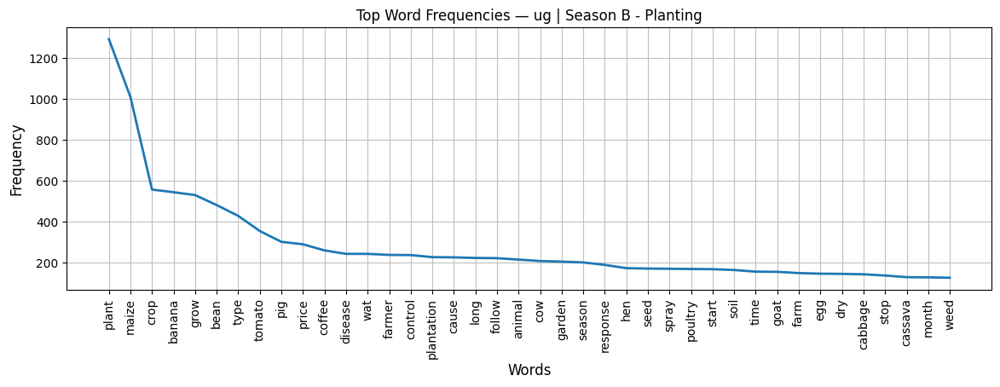


   Season A - Harvest (5,987 questions)
   plant(1042), tomato(498), maize(489), crop(414), grow(397), bean(358), banana(356), type(342), price(273), pig(253)


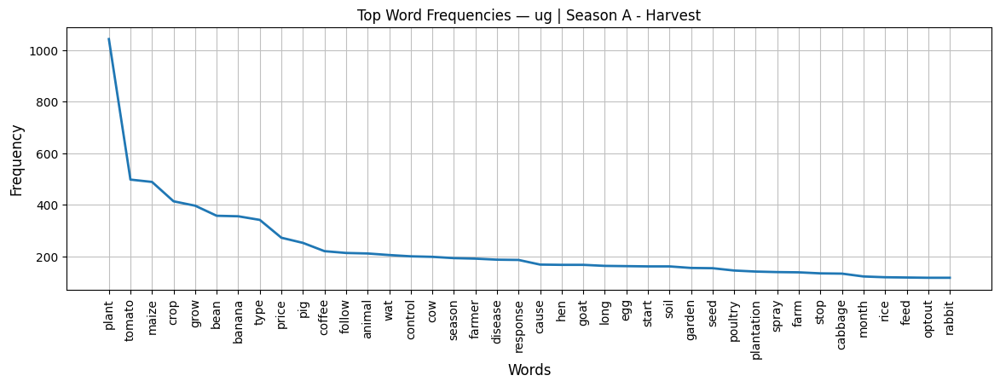


   Season B - Harvest (4,548 questions)
   plant(731), banana(344), maize(344), grow(307), crop(300), type(277), tomato(231), pig(218), bean(198), price(197)


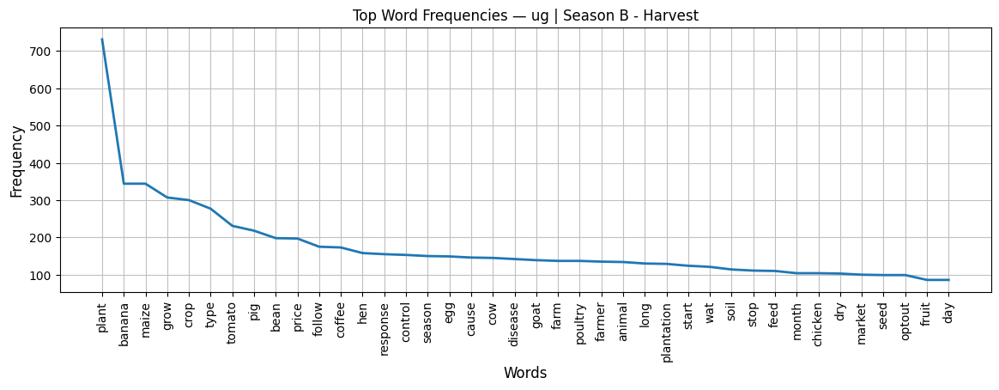

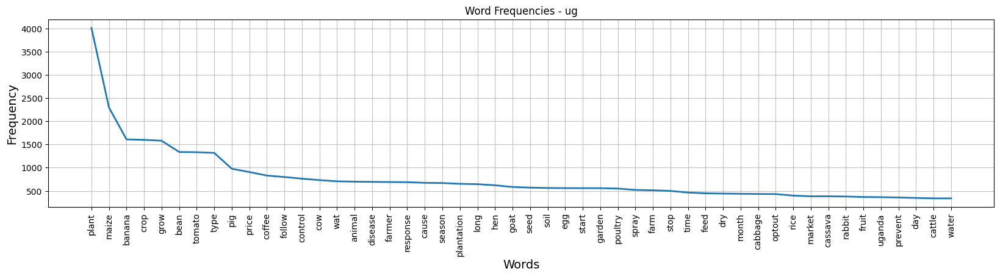

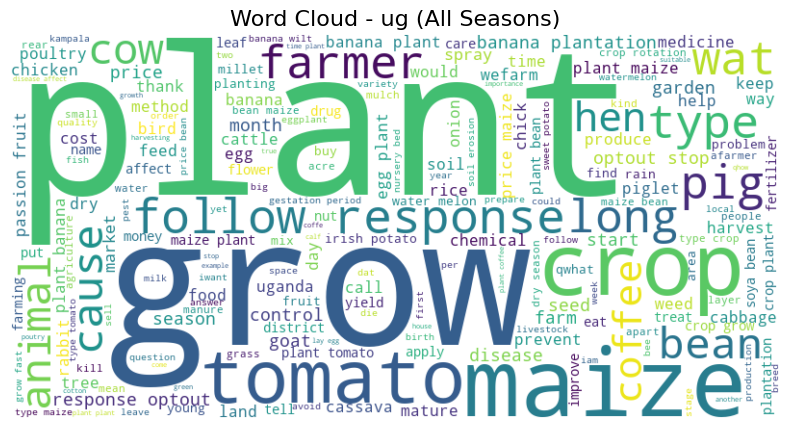

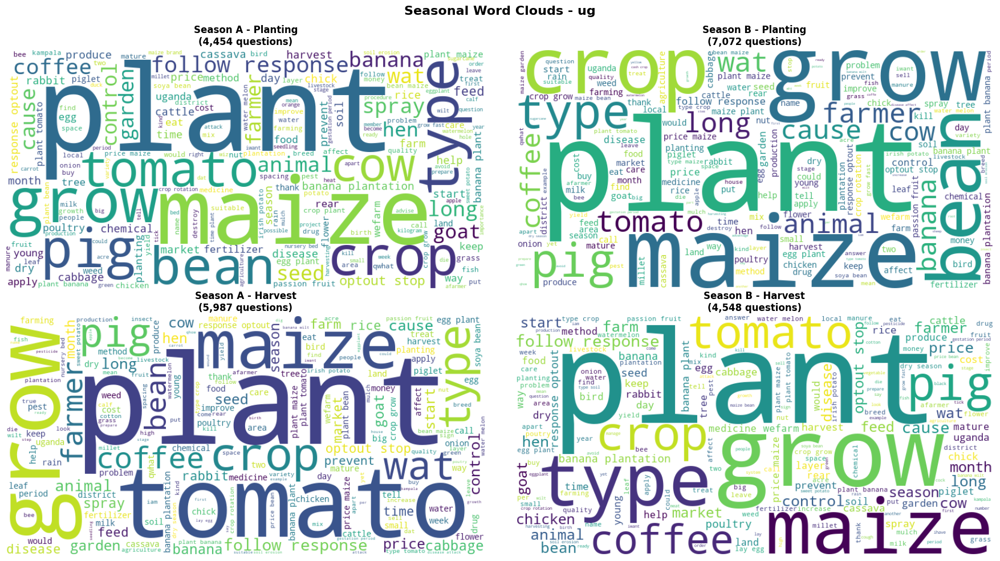


✓ ANALYSIS COMPLETE


In [36]:
# ============================================================
# KEYWORDS BY COUNTRY AND SEASON - SIMPLIFIED
# ============================================================
print("\n" + "=" * 60)
print("KEYWORDS BY COUNTRY AND SEASON")
print("=" * 60)

countries = filtered_sample['question_user_country_code'].dropna().unique()
print(f"Countries: {sorted(countries)}\n")

for country in sorted(countries):
    country_df = filtered_sample[filtered_sample['question_user_country_code'] == country]
    
    if len(country_df) == 0:
        continue
    
    # ========== HEADER ==========
    print("=" * 60)
    print(f"COUNTRY: {country} ({len(country_df):,} questions)")
    print("=" * 60)
    
    # ========== OVERALL KEYWORDS ==========
    all_text = ' '.join(country_df['question_content_cleaned'].dropna().astype(str))
    
    if not all_text.strip():
        print(f"⚠ No text data for {country}\n")
        continue
    
    all_words = [w for w in all_text.split() if w.lower() not in my_stopwords]
    freq_all = nltk.FreqDist(all_words)
    top_20 = freq_all.most_common(20)
    
    print(f"\n Top 20 Words Overall:")
    print(f"   {', '.join([f'{w}({c})' for w, c in top_20])}")
    
    # ========== SEASONAL KEYWORDS ==========
    print(f"\n By Season:")
    
    for season in country_df['farming_season'].dropna().unique():
        if season == "Not Classified":
            continue
        
        season_df = country_df[country_df['farming_season'] == season]
        season_text = ' '.join(season_df['question_content_cleaned'].dropna().astype(str))
        
        if not season_text.strip():
            continue
        
        season_words = [w for w in season_text.split() if w.lower() not in my_stopwords]
        season_freq = nltk.FreqDist(season_words)
        season_top = season_freq.most_common(10)
        
        print(f"\n   {season} ({len(season_df):,} questions)")
        print(f"   {', '.join([f'{w}({c})' for w, c in season_top])}")
        
        # ========== ✅ NEW: Seasonal frequency plot ==========
        plt.figure(figsize=(14, 4))
        season_freq.plot(
            40,
            title=f"Top Word Frequencies — {country} | {season}",
            cumulative=False
        )
        plt.xlabel("Words", fontsize=12)
        plt.ylabel("Frequency", fontsize=12)
        plt.show()
    
    # ========== VISUALIZATIONS ==========
    
    # Overall frequency plot
    plt.figure(figsize=(20, 4))
    freq_all.plot(50, title=f"Word Frequencies - {country}")
    plt.xlabel('Words', fontsize=14)
    plt.ylabel('Frequency', fontsize=14)
    plt.show()
    
    # Overall word cloud
    try:
        wc_all = WordCloud(
            width=800,
            height=400,
            background_color='white',
            stopwords=my_stopwords
        ).generate(all_text)
        
        plt.figure(figsize=(12, 5))
        plt.imshow(wc_all, interpolation='bilinear')
        plt.title(f"Word Cloud - {country} (All Seasons)", fontsize=16)
        plt.axis('off')
        plt.show()
        
    except Exception as e:
        print(f"⚠ Word cloud failed: {e}")
    
    # Seasonal word clouds
    seasons = [s for s in country_df['farming_season'].unique() 
               if pd.notna(s) and s != "Not Classified"]
    
    if len(seasons) > 1:
        n_cols = min(2, len(seasons))
        n_rows = (len(seasons) + 1) // 2
        
        fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 5*n_rows))
        axes = axes.flatten() if len(seasons) > 1 else [axes]
        
        for idx, season in enumerate(seasons):
            season_df = country_df[country_df['farming_season'] == season]
            season_text = ' '.join(season_df['question_content_cleaned'].dropna().astype(str))
            
            if season_text.strip():
                wc = WordCloud(
                    width=800,
                    height=400,
                    background_color='white',
                    stopwords=my_stopwords,
                    colormap='viridis'
                ).generate(season_text)
                
                axes[idx].imshow(wc, interpolation='bilinear')
                axes[idx].set_title(
                    f'\n{season}\n({len(season_df):,} questions)',
                    fontsize=12,
                    fontweight='bold'
                )
                axes[idx].axis('off')

        
        # Hide unused subplots
        for idx in range(len(seasons), len(axes)):
            axes[idx].axis('off')
        
        plt.suptitle(
            f'Seasonal Word Clouds - {country}',
            fontsize=16,
            fontweight='bold'
        )
        plt.tight_layout()
        plt.show()
    
    print()  # Spacer

print("=" * 60)
print("✓ ANALYSIS COMPLETE")
print("=" * 60)



KEYWORDS BY COUNTRY AND SEASON
Countries: ['GB', 'KE', 'UG']

COUNTRY: GB (1 questions)

TOP 20 WORDS OVERALL:
   food(1), nearby(1)

BY SEASON:


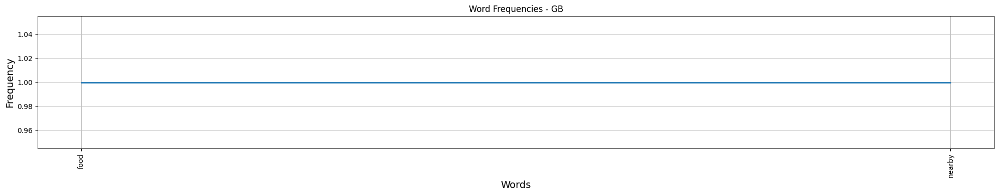

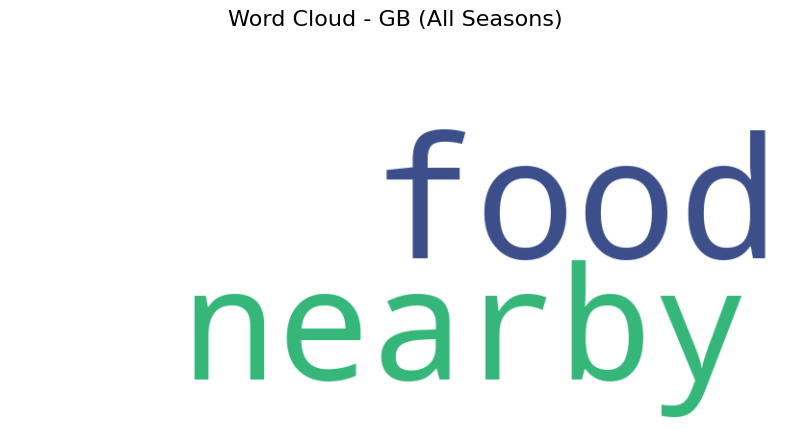


COUNTRY: KE (37,159 questions)

TOP 20 WORDS OVERALL:
   plant(7630), maize(5539), cow(3897), crop(2440), type(2177), tomato(2155), bean(1960), chicken(1528), chick(1438), potato(1416), seed(1410), farm(1368), feed(1280), hen(1232), long(1202), grow(1154), control(1153), milk(1114), dairy(1087), farmer(1062)

BY SEASON:

   Harvest Period (12,317 questions)
   plant(2565), maize(1383), cow(1142), tomato(1101), crop(805), type(723), bean(641), seed(489), potato(469), farm(462)


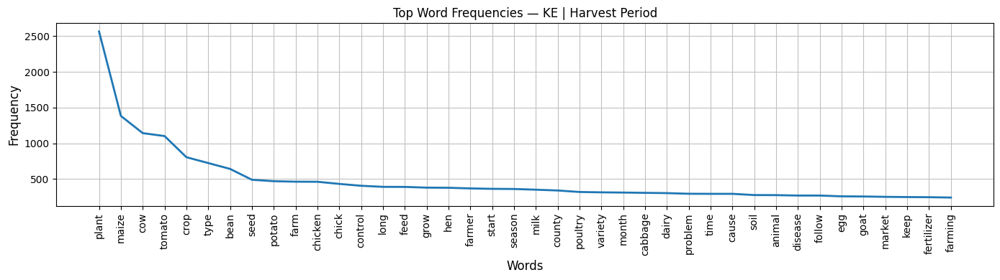


   Long Rains - Planting (8,631 questions)
   plant(1965), maize(1421), cow(804), crop(597), bean(585), type(529), potato(388), seed(365), tomato(331), farm(315)


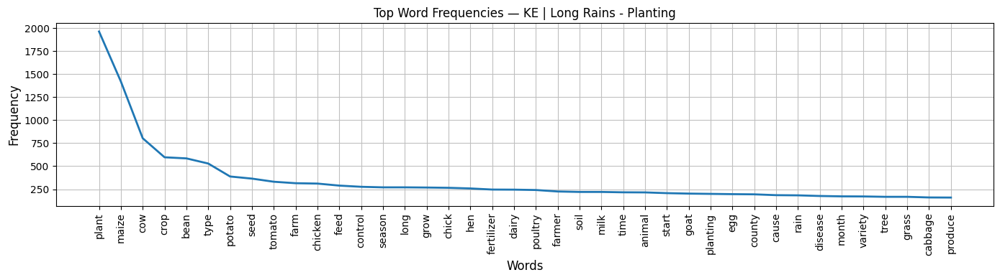


   September - Off-season (4,068 questions)
   plant(969), maize(815), cow(430), crop(279), bean(268), tomato(247), type(232), seed(184), chick(178), farm(169)


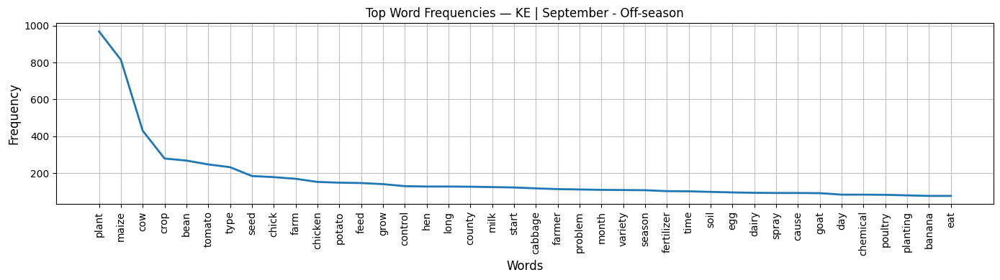


   Short Rains - Planting (12,143 questions)
   plant(2131), maize(1920), cow(1521), crop(759), type(693), chicken(604), chick(564), tomato(476), hen(470), bean(466)


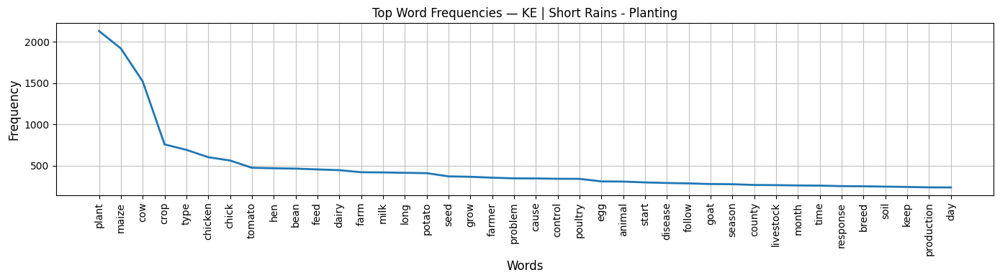


SEASON EXPECTATION vs ACTUAL KEYWORDS
------------------------------------------------------------------------------------------
                Season                                                  Expected Keywords                                               Top-10 Found Words
        Harvest Period    harvest, drying, storage, market, transport, price, postharvest  plant, maize, cow, tomato, crop, type, bean, seed, potato, farm
 Long Rains - Planting planting, seed, soil, fertilizer, pest, disease, spraying, weeding  plant, maize, cow, crop, bean, type, potato, seed, tomato, farm
September - Off-season                          planning, inputs, training, loans, market   plant, maize, cow, crop, bean, tomato, type, seed, chick, farm
Short Rains - Planting                    planting, seed, soil, pest, fertilizer, weeding plant, maize, cow, crop, type, chicken, chick, tomato, hen, bean


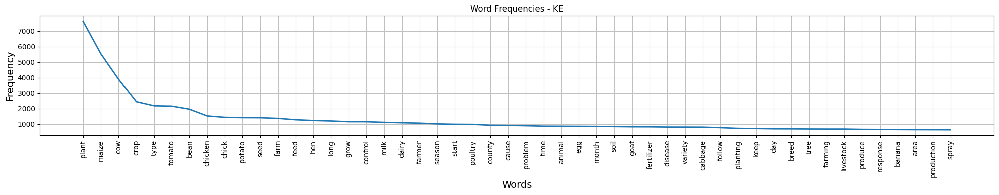

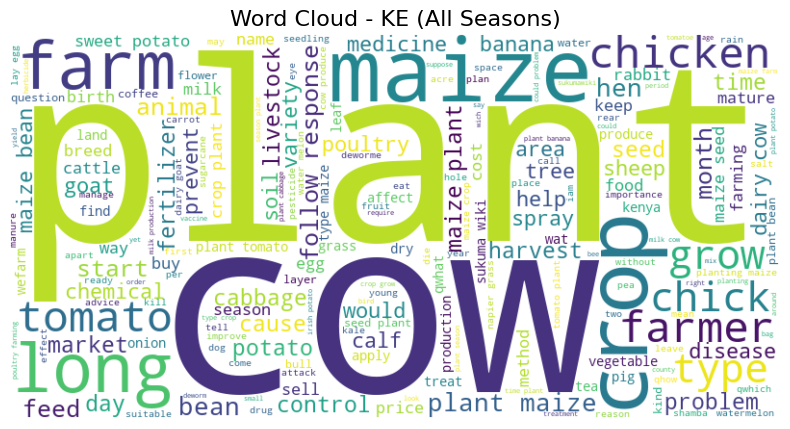

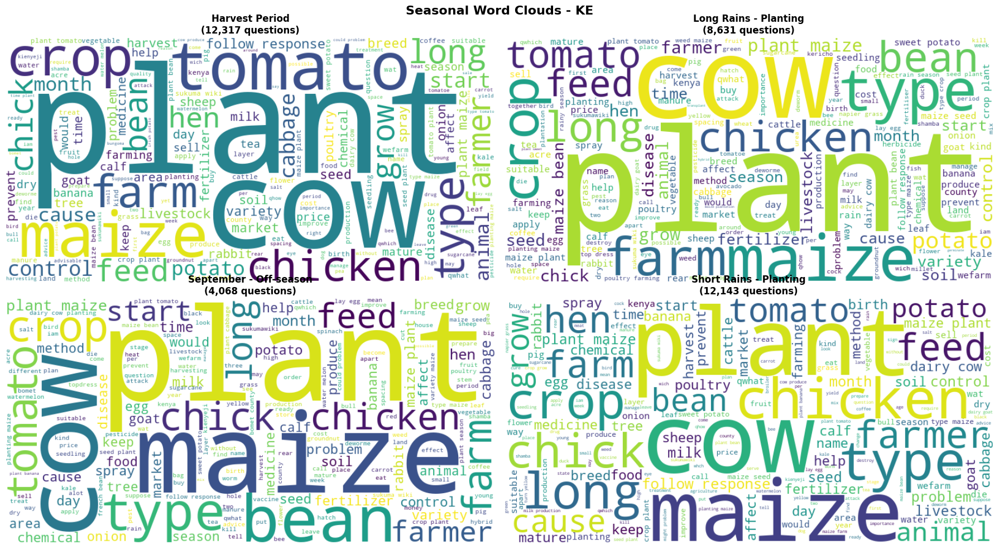


COUNTRY: UG (22,061 questions)

TOP 20 WORDS OVERALL:
   plant(4015), maize(2298), banana(1611), crop(1601), grow(1582), bean(1340), tomato(1335), type(1320), pig(978), price(907), coffee(831), follow(800), control(764), cow(733), wat(707), animal(700), disease(695), farmer(691), response(688), cause(674)

BY SEASON:

   Season A - Harvest (5,987 questions)
   plant(1042), tomato(498), maize(489), crop(414), grow(397), bean(358), banana(356), type(342), price(273), pig(253)


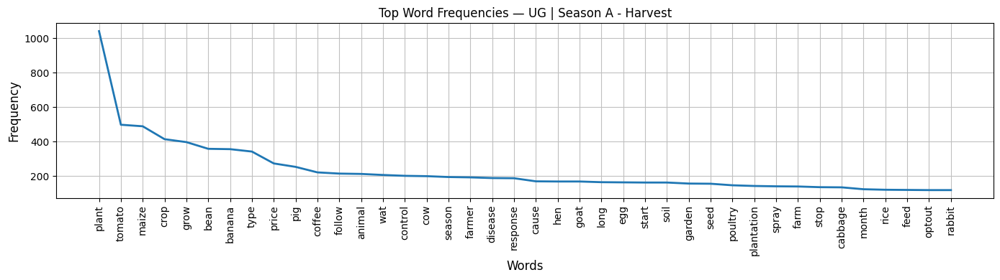


   Season A - Planting (4,454 questions)
   plant(948), maize(455), banana(367), grow(348), crop(330), bean(303), type(273), tomato(252), pig(206), follow(190)


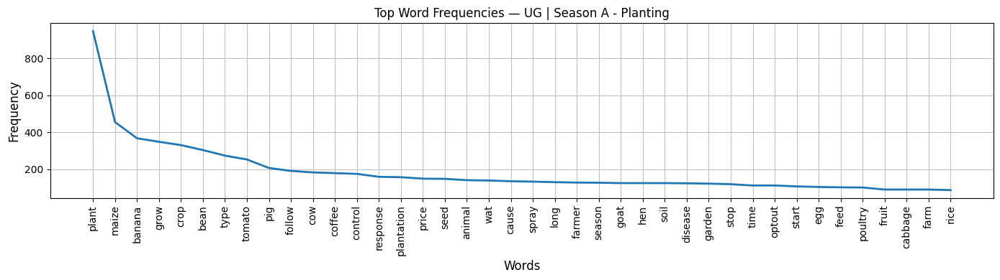


   Season B - Harvest (4,548 questions)
   plant(731), banana(344), maize(344), grow(307), crop(300), type(277), tomato(231), pig(218), bean(198), price(197)


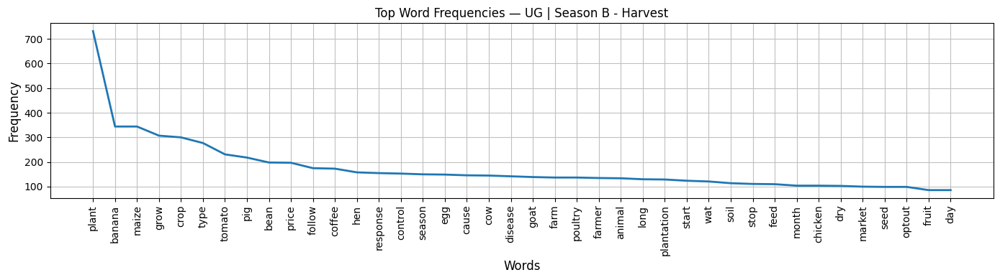


   Season B - Planting (7,072 questions)
   plant(1294), maize(1010), crop(557), banana(544), grow(530), bean(481), type(428), tomato(354), pig(301), price(289)


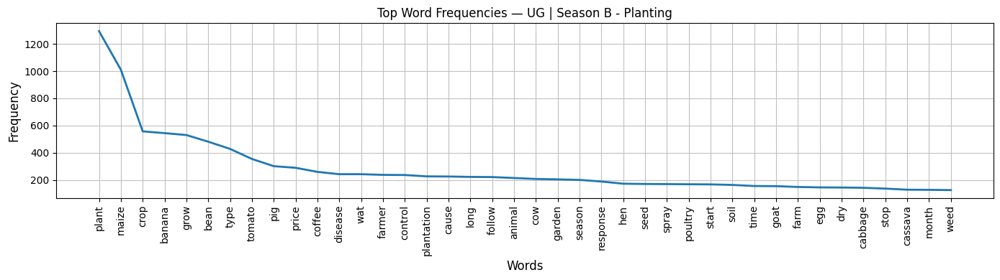


SEASON EXPECTATION vs ACTUAL KEYWORDS
------------------------------------------------------------------------------------------
             Season                                  Expected Keywords                                                Top-10 Found Words
 Season A - Harvest    harvest, drying, storage, processing, transport  plant, tomato, maize, crop, grow, bean, banana, type, price, pig
Season A - Planting   planting, seed, fertilizer, pest, spraying, land plant, maize, banana, grow, crop, bean, type, tomato, pig, follow
 Season B - Harvest         harvest, storage, market, price, transport  plant, banana, maize, grow, crop, type, tomato, pig, bean, price
Season B - Planting planting, seed, fertilizer, pest, disease, weeding  plant, maize, crop, banana, grow, bean, type, tomato, pig, price


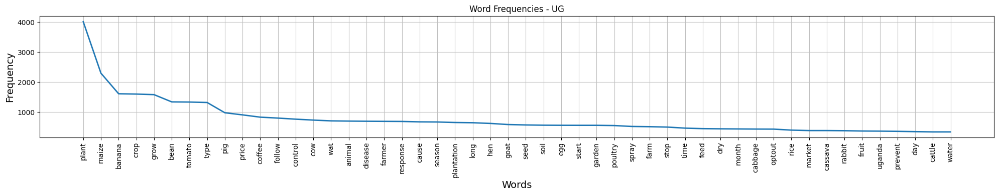

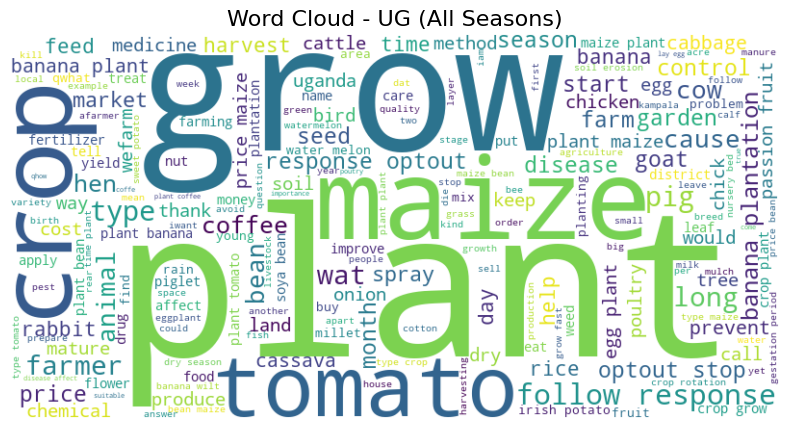

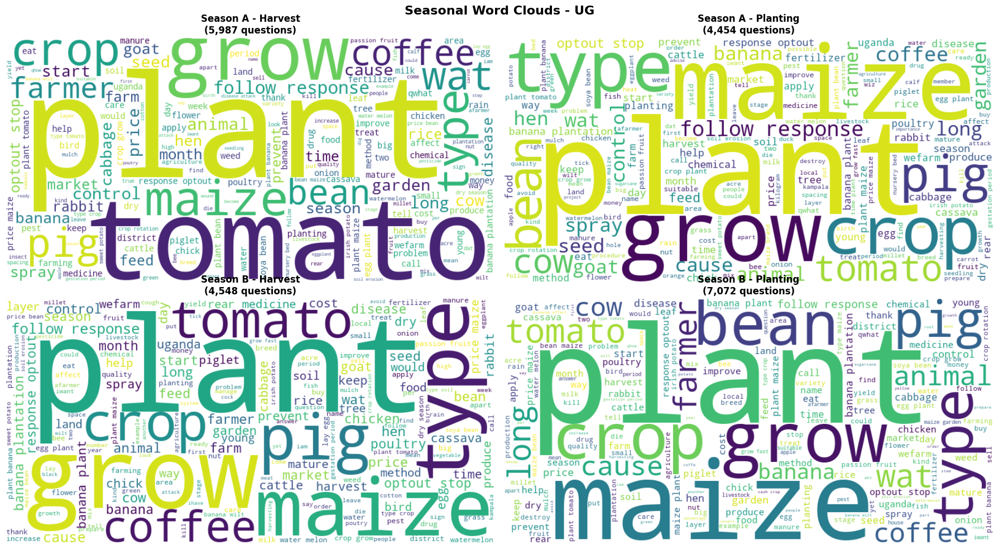


✓ ANALYSIS COMPLETE


In [40]:
# ============================================================
# EXPECTED KEYWORDS BY COUNTRY & SEASON (MATCHING CLASSIFIER)
# ============================================================

expected_keywords = {

    # ---------------- KENYA ----------------
    "KE": {
        "Long Rains - Planting": [
            "planting","seed","soil","fertilizer",
            "pest","disease","spraying","weeding"
        ],
        "Short Rains - Planting": [
            "planting","seed","soil","pest",
            "fertilizer","weeding"
        ],
        "Harvest Period": [
            "harvest","drying","storage","market",
            "transport","price","postharvest"
        ],
        "September - Off-season": [
            "planning","inputs","training",
            "loans","market"
        ],
    },

    # ---------------- UGANDA ----------------
    "UG": {
        "Season A - Planting": [
            "planting","seed","fertilizer",
            "pest","spraying","land"
        ],
        "Season A - Harvest": [
            "harvest","drying","storage",
            "processing","transport"
        ],
        "Season B - Planting": [
            "planting","seed","fertilizer",
            "pest","disease","weeding"
        ],
        "Season B - Harvest": [
            "harvest","storage","market",
            "price","transport"
        ],
    },

    # ---------------- TANZANIA ----------------
    "TZ": {
        "Masika - Planting": [
            "planting","seed","fertilizer",
            "pest","disease","land"
        ],
        "Vuli - Planting": [
            "planting","seed","soil",
            "weeding","pest"
        ],
        "Harvest Period": [
            "harvest","drying","storage",
            "transport","market","price"
        ],
        "Off-season / Other": [
            "planning","inputs","training",
            "finance","market"
        ],
    }
}

# ============================================================
# KEYWORDS BY COUNTRY AND SEASON
# ============================================================

print("\n" + "=" * 60)
print("KEYWORDS BY COUNTRY AND SEASON")
print("=" * 60)

countries = filtered_sample['question_user_country_code'].dropna().str.upper().unique()
print(f"Countries: {sorted(countries)}\n")

for country in sorted(countries):

    country_df = filtered_sample[
        filtered_sample['question_user_country_code'].str.upper() == country
    ]

    if len(country_df) == 0:
        continue

    # ---------------------------------------------------------
    # HEADER
    # ---------------------------------------------------------

    print("=" * 60)
    print(f"COUNTRY: {country} ({len(country_df):,} questions)")
    print("=" * 60)

    # ---------------------------------------------------------
    # OVERALL KEYWORDS
    # ---------------------------------------------------------

    all_text = " ".join(
        country_df['question_content_cleaned']
        .dropna()
        .astype(str)
    )

    if not all_text.strip():
        print(f"⚠ No text data for {country}\n")
        continue

    all_words = [
        w for w in all_text.split()
        if w.lower() not in my_stopwords
    ]

    freq_all = nltk.FreqDist(all_words)
    top_20 = freq_all.most_common(20)

    print("\nTOP 20 WORDS OVERALL:")
    print(
        "   " +
        ", ".join([f"{w}({c})" for w, c in top_20])
    )

    # ---------------------------------------------------------
    # SEASONAL KEYWORDS + FREQUENCY PLOTS
    # ---------------------------------------------------------

    print("\nBY SEASON:")

    for season in sorted(country_df['farming_season'].dropna().unique()):

        if season == "Not Classified":
            continue

        season_df = country_df[
            country_df['farming_season'] == season
        ]

        season_text = " ".join(
            season_df['question_content_cleaned']
            .dropna()
            .astype(str)
        )

        if not season_text.strip():
            continue

        season_words = [
            w for w in season_text.split()
            if w.lower() not in my_stopwords
        ]

        season_freq = nltk.FreqDist(season_words)
        season_top = season_freq.most_common(10)

        print(f"\n   {season} ({len(season_df):,} questions)")
        print(
            "   " +
            ", ".join([f"{w}({c})" for w, c in season_top])
        )

        # -------- frequency plot --------
        plt.figure(figsize=(14, 4))
        season_freq.plot(
            40,
            title=f"Top Word Frequencies — {country} | {season}"
        )
        plt.xlabel("Words", fontsize=12)
        plt.ylabel("Frequency", fontsize=12)
        plt.tight_layout()
        plt.show()


    # ---------------------------------------------------------
    # SEASON EXPECTATION vs ACTUAL TABLE
    # ---------------------------------------------------------

    rows = []

    for season in sorted(country_df['farming_season'].dropna().unique()):

        if season == "Not Classified":
            continue

        season_df = country_df[
            country_df['farming_season'] == season
        ]

        season_text = " ".join(
            season_df['question_content_cleaned']
            .dropna()
            .astype(str)
        )

        if not season_text.strip():
            continue

        season_words = [
            w for w in season_text.split()
            if w.lower() not in my_stopwords
        ]

        season_freq = nltk.FreqDist(season_words)
        found_words = [
            w for w, _ in season_freq.most_common(10)
        ]

        expected = expected_keywords.get(country, {}).get(
            season,
            ["(No expectations defined)"]
        )

        rows.append({
            "Season": season,
            "Expected Keywords": ", ".join(expected),
            "Top-10 Found Words": ", ".join(found_words)
        })


    if rows:

        comparison_table = pd.DataFrame(rows)

        print("\nSEASON EXPECTATION vs ACTUAL KEYWORDS")
        print("-" * 90)
        print(comparison_table.to_string(index=False))


    # ---------------------------------------------------------
    # VISUALIZATIONS
    # ---------------------------------------------------------

    # -------- Overall frequency plot --------

    plt.figure(figsize=(20, 4))
    freq_all.plot(50, title=f"Word Frequencies - {country}")
    plt.xlabel("Words", fontsize=14)
    plt.ylabel("Frequency", fontsize=14)
    plt.tight_layout()
    plt.show()


    # -------- Overall word cloud --------

    try:
        wc_all = WordCloud(
            width=800,
            height=400,
            background_color="white",
            stopwords=my_stopwords
        ).generate(all_text)

        plt.figure(figsize=(12, 5))
        plt.imshow(wc_all, interpolation="bilinear")
        plt.title(f"Word Cloud - {country} (All Seasons)", fontsize=16)
        plt.axis("off")
        plt.show()

    except Exception as e:
        print(f"⚠ Word cloud failed: {e}")


    # -------- Seasonal word clouds --------

    seasons = sorted([
        s for s in country_df['farming_season'].unique()
        if pd.notna(s) and s != "Not Classified"
    ])

    if seasons:

        n_cols = min(2, len(seasons))
        n_rows = (len(seasons) + 1) // 2

        fig, axes = plt.subplots(
            n_rows,
            n_cols,
            figsize=(18, 5 * n_rows)
        )

        axes = axes.flatten() if len(seasons) > 1 else [axes]

        for idx, season in enumerate(seasons):

            season_df = country_df[
                country_df['farming_season'] == season
            ]

            season_text = " ".join(
                season_df['question_content_cleaned']
                .dropna()
                .astype(str)
            )

            if not season_text.strip():
                continue

            wc = WordCloud(
                width=800,
                height=400,
                background_color="white",
                stopwords=my_stopwords,
                colormap="viridis"
            ).generate(season_text)

            axes[idx].imshow(wc, interpolation="bilinear")
            axes[idx].set_title(
                f"{season}\n({len(season_df):,} questions)",
                fontsize=12,
                fontweight="bold"
            )
            axes[idx].axis('off')

        for i in range(len(seasons), len(axes)):
            axes[i].axis('off')

        plt.suptitle(
            f"Seasonal Word Clouds - {country}",
            fontsize=16,
            fontweight="bold"
        )

        plt.tight_layout()
        plt.show()

    print()   # spacer


print("=" * 60)
print("✓ ANALYSIS COMPLETE")
print("=" * 60)


# ANALYSIS THE COMPLETE DATASET

In [42]:
# Quick exploration
conn = duckdb.connect()

print("=" * 60)
print("STEP 1: Checking CSV Structure")
print("=" * 60)

df = conn.execute("""
    SELECT question_content, question_sent, question_user_country_code FROM 'b0cd514b-b9cc-4972-a0c2-c91726e6d825.csv'
    WHERE question_language = 'eng'
""").df()
print(f"\nTotal columns: {len(df)}")
df.info()

STEP 1: Checking CSV Structure

Total columns: 11976781
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11976781 entries, 0 to 11976780
Data columns (total 3 columns):
 #   Column                      Dtype                        
---  ------                      -----                        
 0   question_content            object                       
 1   question_sent               datetime64[us, Europe/London]
 2   question_user_country_code  object                       
dtypes: datetime64[us, Europe/London](1), object(2)
memory usage: 274.1+ MB


In [45]:
df.head(5)

,question_content,question_sent,question_user_country_code
0,Q this goes to wefarm. is it possible to get f...,2017-11-22 12:25:05+00:00,ug
1,Q-i have stock rabbit's urine for 5 weeks mash...,2017-11-22 12:25:10+00:00,ke
2,Q J Have Mi 10000 Can J Start Aproject Of Pout...,2017-11-22 12:25:12+00:00,ug
3,WHERE DO I GET SEEDS OF COCONUT?,2017-11-22 12:25:12+00:00,ke
4,WHERE DO I GET SEEDS OF COCONUT?,2017-11-22 12:25:12+00:00,ke


In [ ]:
# ============================================================
# KEYWORDS BY COUNTRY AND SEASON
# ============================================================

print("\n" + "=" * 60)
print("KEYWORDS BY COUNTRY AND SEASON")
print("=" * 60)

countries = df['question_user_country_code'].dropna().str.upper().unique()
df['question_content_cleaned'] = df['question_content'].apply(process_text)

print(f"Countries: {sorted(countries)}\n")



KEYWORDS BY COUNTRY AND SEASON


In [ ]:

for country in sorted(countries):

    country_df = df[
        df['question_user_country_code'].str.upper() == country
    ]

    if len(country_df) == 0:
        continue

    # ---------------------------------------------------------
    # HEADER
    # ---------------------------------------------------------

    print("=" * 60)
    print(f"COUNTRY: {country} ({len(country_df):,} questions)")
    print("=" * 60)

    # ---------------------------------------------------------
    # OVERALL KEYWORDS
    # ---------------------------------------------------------

    all_text = " ".join(
        country_df['question_content_cleaned']
        .dropna()
        .astype(str)
    )

    if not all_text.strip():
        print(f"⚠ No text data for {country}\n")
        continue

    all_words = [
        w for w in all_text.split()
        if w.lower() not in my_stopwords
    ]

    freq_all = nltk.FreqDist(all_words)
    top_20 = freq_all.most_common(20)

    print("\nTOP 20 WORDS OVERALL:")
    print(
        "   " +
        ", ".join([f"{w}({c})" for w, c in top_20])
    )

    # ---------------------------------------------------------
    # SEASONAL KEYWORDS + FREQUENCY PLOTS
    # ---------------------------------------------------------

    print("\nBY SEASON:")

    for season in sorted(country_df['farming_season'].dropna().unique()):

        if season == "Not Classified":
            continue

        season_df = country_df[
            country_df['farming_season'] == season
        ]

        season_text = " ".join(
            season_df['question_content_cleaned']
            .dropna()
            .astype(str)
        )

        if not season_text.strip():
            continue

        season_words = [
            w for w in season_text.split()
            if w.lower() not in my_stopwords
        ]

        season_freq = nltk.FreqDist(season_words)
        season_top = season_freq.most_common(10)

        print(f"\n   {season} ({len(season_df):,} questions)")
        print(
            "   " +
            ", ".join([f"{w}({c})" for w, c in season_top])
        )

        # -------- frequency plot --------
        plt.figure(figsize=(14, 4))
        season_freq.plot(
            40,
            title=f"Top Word Frequencies — {country} | {season}"
        )
        plt.xlabel("Words", fontsize=12)
        plt.ylabel("Frequency", fontsize=12)
        plt.tight_layout()
        plt.show()


    # ---------------------------------------------------------
    # SEASON EXPECTATION vs ACTUAL TABLE
    # ---------------------------------------------------------

    rows = []

    for season in sorted(country_df['farming_season'].dropna().unique()):

        if season == "Not Classified":
            continue

        season_df = country_df[
            country_df['farming_season'] == season
        ]

        season_text = " ".join(
            season_df['question_content_cleaned']
            .dropna()
            .astype(str)
        )

        if not season_text.strip():
            continue

        season_words = [
            w for w in season_text.split()
            if w.lower() not in my_stopwords
        ]

        season_freq = nltk.FreqDist(season_words)
        found_words = [
            w for w, _ in season_freq.most_common(10)
        ]

        expected = expected_keywords.get(country, {}).get(
            season,
            ["(No expectations defined)"]
        )

        rows.append({
            "Season": season,
            "Expected Keywords": ", ".join(expected),
            "Top-10 Found Words": ", ".join(found_words)
        })


    if rows:

        comparison_table = pd.DataFrame(rows)

        print("\nSEASON EXPECTATION vs ACTUAL KEYWORDS")
        print("-" * 90)
        print(comparison_table.to_string(index=False))


    # ---------------------------------------------------------
    # VISUALIZATIONS
    # ---------------------------------------------------------

    # -------- Overall frequency plot --------

    plt.figure(figsize=(20, 4))
    freq_all.plot(50, title=f"Word Frequencies - {country}")
    plt.xlabel("Words", fontsize=14)
    plt.ylabel("Frequency", fontsize=14)
    plt.tight_layout()
    plt.show()


    # -------- Overall word cloud --------

    try:
        wc_all = WordCloud(
            width=800,
            height=400,
            background_color="white",
            stopwords=my_stopwords
        ).generate(all_text)

        plt.figure(figsize=(12, 5))
        plt.imshow(wc_all, interpolation="bilinear")
        plt.title(f"Word Cloud - {country} (All Seasons)", fontsize=16)
        plt.axis("off")
        plt.show()

    except Exception as e:
        print(f"⚠ Word cloud failed: {e}")


    # -------- Seasonal word clouds --------

    seasons = sorted([
        s for s in country_df['farming_season'].unique()
        if pd.notna(s) and s != "Not Classified"
    ])

    if seasons:

        n_cols = min(2, len(seasons))
        n_rows = (len(seasons) + 1) // 2

        fig, axes = plt.subplots(
            n_rows,
            n_cols,
            figsize=(18, 5 * n_rows)
        )

        axes = axes.flatten() if len(seasons) > 1 else [axes]

        for idx, season in enumerate(seasons):

            season_df = country_df[
                country_df['farming_season'] == season
            ]

            season_text = " ".join(
                season_df['question_content_cleaned']
                .dropna()
                .astype(str)
            )

            if not season_text.strip():
                continue

            wc = WordCloud(
                width=800,
                height=400,
                background_color="white",
                stopwords=my_stopwords,
                colormap="viridis"
            ).generate(season_text)

            axes[idx].imshow(wc, interpolation="bilinear")
            axes[idx].set_title(
                f"{season}\n({len(season_df):,} questions)",
                fontsize=12,
                fontweight="bold"
            )
            axes[idx].axis('off')

        for i in range(len(seasons), len(axes)):
            axes[i].axis('off')

        plt.suptitle(
            f"Seasonal Word Clouds - {country}",
            fontsize=16,
            fontweight="bold"
        )

        plt.tight_layout()
        plt.show()

    print()   # spacer


print("=" * 60)
print("✓ ANALYSIS COMPLETE")
print("=" * 60)
